<a href="https://colab.research.google.com/github/LGLV-Ciencia-de-Datos/Paclobutrazol_like-ML/blob/main/Fusarium_DB_Cliffs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Librerias a emplear

In [ ]:
import time
tic =time.time()
from IPython.utils import io # permite uso de instancias "input - output."
import tqdm.notebook
total = 100
with tqdm.notebook.tqdm(total=total) as pbar:
    with io.capture_output() as captured:
      pbar.update(20)
      !pip install rdkit
      !pip install molplotly #Libreria, extensión de plotly, para visualización de estructuras en 2D
      !pip install Pillow   # generación de imágenes.
      !pip install jupyter-dash    # librería para la visualización de datos de forma interactiva.
      !pip install dash-bootstrap-components  # diseño de aplicación dash.
      !pip install datamol  # librería para el manejo de moléculas. Documentación: https://github.com/datamol-io/datamol
      !pip install sklearn  # librería para el uso de machine learning en Python. Documentación: https://scikit-learn.org/stable/
      !pip install yellowbrick # librería para la visualización de modelos tipo machine learning. Documentación: https://www.scikit-yb.org/en/latest/
      !pip install molfeat
      !pip install kaleido
      !pip install dash-bootstrap-components
      pbar.update(20)

      import os, sys, random, requests
      import pandas as pd
      import rdkit as rk # URL para consultar documentación y manual de uso: https://www.rdkit.org/docs/
      from rdkit import Chem, DataStructs
      from rdkit.Chem import AllChem, Draw, rdFMCS  # visualización y uso de estructuras.
      from rdkit.Chem.Draw import rdMolDraw2D, IPythonConsole, rdDepictor
      rdDepictor.SetPreferCoordGen(True)
      IPythonConsole.drawOptions.minFontSize=25   # Instancias para la creación de imágenes.
      pbar.update(20)
      from rdkit.Geometry import DataStructs
      import numpy as np               # URL para consultar documentación y manual de uso: https://numpy.org/doc/
      from numpy.ma.core import shape
      import math
      import seaborn as sns            # URL para consultar documentación y manual de uso: https://seaborn.pydata.org/
      import matplotlib.pyplot as plt
      import plotly.express as px      # URL para consultar documentación y manual de uso: https://plotly.com/python/
      import plotly.graph_objects as go
      from PIL import Image, ImageDraw, ImageFont   # importación de la librería Pillow, visualización de imagenes, ImageDraw:fuente que desee el usuario
      pbar.update(20)
      from  jupyter_dash import JupyterDash
      import dash
      from dash import dcc, html, dash_table
      from dash.dependencies import Input, Output   # Generación de aplicación web.
      import dash_bootstrap_components as dbc
      from google.colab import files # descargar archivos
      from pydoc import classify_class_attrs
      import base64     # instancias para la codificación de información.
      from io import BytesIO
      import datamol as dm
      from molfeat.calc import FPCalculator, FP_FUNCS
      from molfeat.trans import MoleculeTransformer
      from sklearn.model_selection import train_test_split
      from sklearn.ensemble import HistGradientBoostingRegressor, RandomForestRegressor
      from yellowbrick.regressor import prediction_error, residuals_plot
      from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error,classification_report, confusion_matrix, accuracy_score   # accuracy_score:importación de métricas
      from lightgbm import LGBMRegressor
      from xgboost import XGBRegressor
      import networkx as nx
      from functools import reduce
      pbar.update(20)
toc =time.time()
print("Time: "+ str((toc-tic))+" s")

  0%|          | 0/100 [00:00<?, ?it/s]

AttributeError: _ARRAY_API not found

AttributeError: _ARRAY_API not found

AttributeError: _ARRAY_API not found

AttributeError: _ARRAY_API not found

AttributeError: _ARRAY_API not found

AttributeError: _ARRAY_API not found

AttributeError: _ARRAY_API not found

AttributeError: _ARRAY_API not found

AttributeError: _ARRAY_API not found

AttributeError: _ARRAY_API not found

AttributeError: _ARRAY_API not found

AttributeError: _ARRAY_API not found

Time: 218.04321956634521 s


El objetivo de este estudio de caso es realizar un análisis de similitud química de una serie de compuestos que actúan sobre el target biológico denominado Fusarium Oxisporum. Este target es de interés para estudios relacionados a la actividad antifúngica. La base de datos química fue obtenida a partir de CHEMBL. Los parámetros que serán usados para realizar el análisis de similitud son: MIC y el Coeficiente de Tanimoto.

<a name='1'></a>

#**Sección 1. Obtención de base de datos.**
La base de datos puede ser cargada a través de dos métodos:
1. Cargando y leyendo el archivo (.csv, .xlsx) directamente
2. Usando la API de ChEMBL.

<a name='1.1'></a>

## Carga y lectura de base de datos:

In [ ]:
url = 'https://raw.githubusercontent.com/LGLV-Ciencia-de-Datos/Paclobutrazol_like-ML/refs/heads/main/Fusarium_Oxysporum(1).csv'
# url="https://raw.githubusercontent.com/DIFACQUIM/Cursos/main/Datasets/08_Similitud_GPR40.csv"
database_original_direct = pd.read_csv(url)
print(database_original_direct.info())
database_original_direct[0:2]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 642 entries, 0 to 641
Data columns (total 28 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          642 non-null    int64  
 1   molecule_chembl_id  642 non-null    object 
 2   canonical_smiles    642 non-null    object 
 3   standard_value      642 non-null    float64
 4   standard_units      642 non-null    object 
 5   target_chembl_id    642 non-null    object 
 6   target_organism     642 non-null    object 
 7   MW                  642 non-null    float64
 8   LogP                642 non-null    float64
 9   HBA                 642 non-null    int64  
 10  HBD                 642 non-null    int64  
 11  RotatableBonds      642 non-null    float64
 12  violations          642 non-null    float64
 13  uM                  642 non-null    float64
 14  pMIC_ug/mL-1        642 non-null    float64
 15  pMIC_uM             642 non-null    float64
 16  NEW_SMIL

,Unnamed: 0,molecule_chembl_id,canonical_smiles,standard_value,standard_units,target_chembl_id,target_organism,MW,LogP,HBA,...,logP,TPSA,CSP3,NumRings,HetAtoms,RotBonds,Molecule,QED,SA,Dataset
0,2,CHEMBL393258,COc1cc(O)cc2c1C(=O)O[C@@H](C)CCCCCCC2,100.0,ug.mL-1,CHEMBL612648,Fusarium oxysporum,292.167459,3.8428,4,...,3.8428,55.76,0.588235,2,4,1,<rdkit.Chem.rdchem.Mol object at 0x7a2419f2f4c0>,0.798916,3.168201,Fusarium oxysporum
1,3,CHEMBL211893,CC1CCCCCCCc2cc(O)cc(O)c2C(=O)O1,50.0,ug.mL-1,CHEMBL612648,Fusarium oxysporum,278.151809,3.5398,4,...,3.5398,66.76,0.562500,2,4,0,<rdkit.Chem.rdchem.Mol object at 0x7a2419f2f140>,0.712264,3.199496,Fusarium oxysporum


In [ ]:
database_original_direct.columns

Index(['Unnamed: 0', 'molecule_chembl_id', 'canonical_smiles',
       'standard_value', 'standard_units', 'target_chembl_id',
       'target_organism', 'MW', 'LogP', 'HBA', 'HBD', 'RotatableBonds',
       'violations', 'uM', 'pMIC_ug/mL-1', 'pMIC_uM', 'NEW_SMILES', 'ROMol',
       'logP', 'TPSA', 'CSP3', 'NumRings', 'HetAtoms', 'RotBonds', 'Molecule',
       'QED', 'SA', 'Dataset'],
      dtype='object')

<a name='1.2'></a>

## Pretratamiento de la base de datos.
Limpieza de base de datos con la función "*difference*" (únicamente se extraen las columnas de interés).
Para la eliminación de duplicados se considero la representación molecular InChI.

Para cuantificar el panorama de actividad se emplea el **indice SALI **(Indice del panorama estructura-actividad):

    SALI(i,j) = |Ai − Aj|/ 1 − sim(i,j)
El valor SALI será empleado para mapear lo anterior en un mapa SAS usando una escala de color continua desde x(valores bajos SALI) hasta y (valores altos SALI asociados con ACs). Para este segmento consideramos que dos compuestos están conectados si tienen un score SALI superior al limite de corte establecido (mayor al 70 u 80% de todos los scores) https://pubs.rsc.org/en/content/articlehtml/2023/dd/d3dd00098b

In [ ]:
db_treatment = database_original_direct.drop(database_original_direct.columns.difference(['molecule_chembl_id', # Corrected column name
                                                                                          'NEW_SMILES',
                                                                                          'standard_value',
                                                                                          'pMIC_ug/mL-1', 'pMIC_uM',
                                                                                          'MW']), axis=1)
db_treatment= db_treatment.rename(columns={'standard_value':'MIC'})
db_treatment= db_treatment.sort_values(by=['MIC']).reset_index(drop=True) #Ordenamos con respecto a IC50 para obtener una mejor visualización en la siguiente sección


#Creación de la columna "InChI"
InChI_column = []
for i in db_treatment['NEW_SMILES']:     # Para cada compuesto 'i' dentro de la base de datos, toma su representación SMILES y conviértela a InChI.
  i = Chem.MolFromSmiles(i)
  n_inchi = Chem.MolToInchiKey(i)
  InChI_column.append(n_inchi)
db_treatment.insert(2, 'InChI', InChI_column) #Adición de columna generada con la representación InChI.


'''#Creación de columna "pMIC" (-log Ic50)
db_treatment["pMIC"] = db_treatment["MIC"].apply(lambda x: -1 * math.log10(x*()))
      # Nota: antes de aplicar el logaritmo, debemos convertir las unidades de valor de IC50 [para este caso en específico, 1 ^ -9 ].

#Creación de columna "pMIC_uM" (-log Ic50)
db_treatment["pMIC_uM"] = db_treatment["MIC"].apply(lambda x: -1 * math.log10(x*()))
      # Nota: antes de aplicar el logaritmo, debemos convertir las unidades de valor de IC50 [para este caso en específico, 1 ^ -9 ].'''


#Eliminación de moléculas duplicados
print(f"Datos originales: {db_treatment.shape}")
db_treatment.drop_duplicates(subset=['InChI', 'NEW_SMILES', 'pMIC_ug/mL-1', 'pMIC_uM', 'MW', 'molecule_chembl_id']) # Corrected column name
print(f"Datos tras eliminación de duplicados: {db_treatment.shape}")
db_treatment

Datos originales: (642, 7)
Datos tras eliminación de duplicados: (642, 7)


,molecule_chembl_id,MIC,InChI,MW,pMIC_ug/mL-1,pMIC_uM,NEW_SMILES
0,CHEMBL234895,0.004,FTHKWIMQNXVEHW-UHFFFAOYSA-N,180.024500,2.39794,1.653762,C#CS(=O)(=O)c1ccc(C)cc1
1,CHEMBL1362013,0.200,NJDFKVDRCDBLAV-UHFFFAOYSA-N,261.090212,0.69897,0.116083,Oc1cc(-c2ccccc2)nc2nc3ccccc3n12
2,CHEMBL2435159,0.200,DDIGWNFGZHQAEH-UHFFFAOYSA-N,329.077597,0.69897,0.216537,O=c1cc(-c2ccc(C(F)(F)F)cc2)nc2[nH]c3ccccc3n12
3,CHEMBL2435155,0.200,ARCFHAKHLISNGD-UHFFFAOYSA-N,253.046296,0.69897,0.102405,O=c1cc(C(F)(F)F)nc2[nH]c3ccccc3n12
4,CHEMBL2435147,0.200,DMBKBGOYSSGPRQ-UHFFFAOYSA-N,403.133220,0.69897,0.304720,CC(C)c1cc(=O)n2c3ccccc3n(Cc3cc(=O)oc4ccc(F)cc3...
...,...,...,...,...,...,...,...
637,CHEMBL2262378,1000.000,PLJMLRJMHOGKKC-FOKLQQMPSA-N,456.065904,-3.00000,-3.340168,Cc1ccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)N...
638,CHEMBL2262377,1000.000,RPRWSUUZDNPJOS-FOKLQQMPSA-N,456.065904,-3.00000,-3.340168,Cc1ccc2nc(Cl)c(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)...
639,CHEMBL2262374,1000.000,RBHNDYFGZWJAAV-LSHDLFTRSA-N,442.050254,-3.00000,-3.353710,Cc1cccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)...
640,CHEMBL2262373,1000.000,UOTQVLXTPLCAIU-LSHDLFTRSA-N,442.050254,-3.00000,-3.353710,Cc1ccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)N...


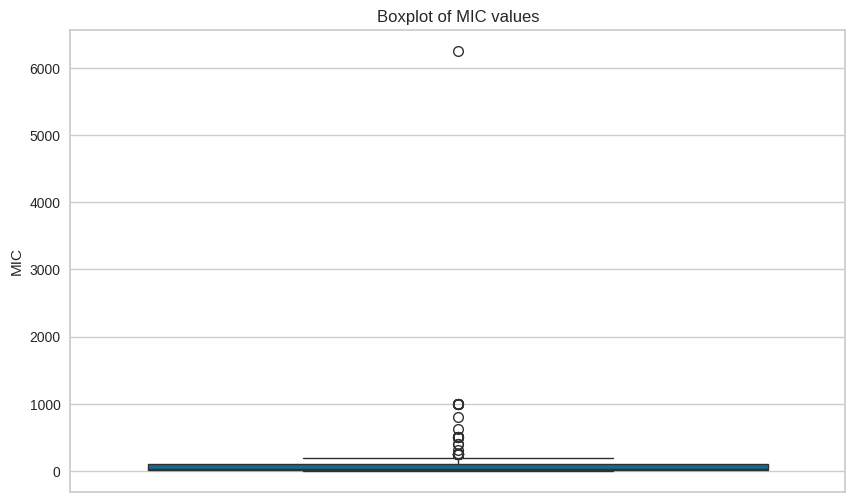

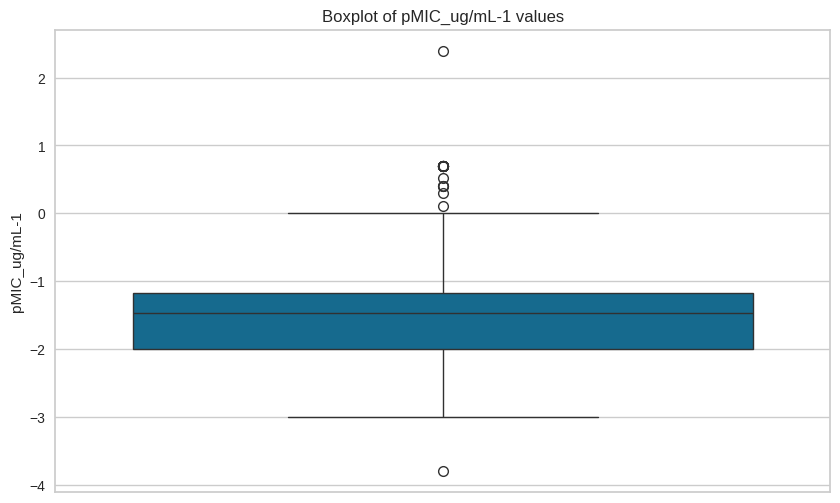

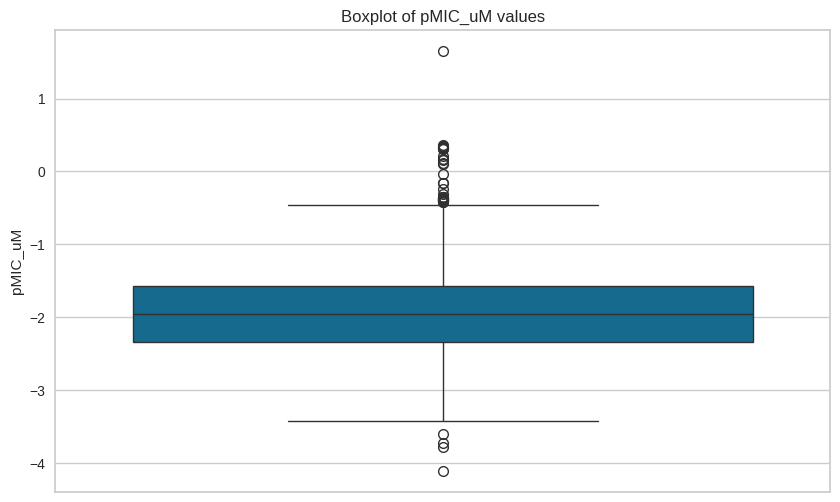

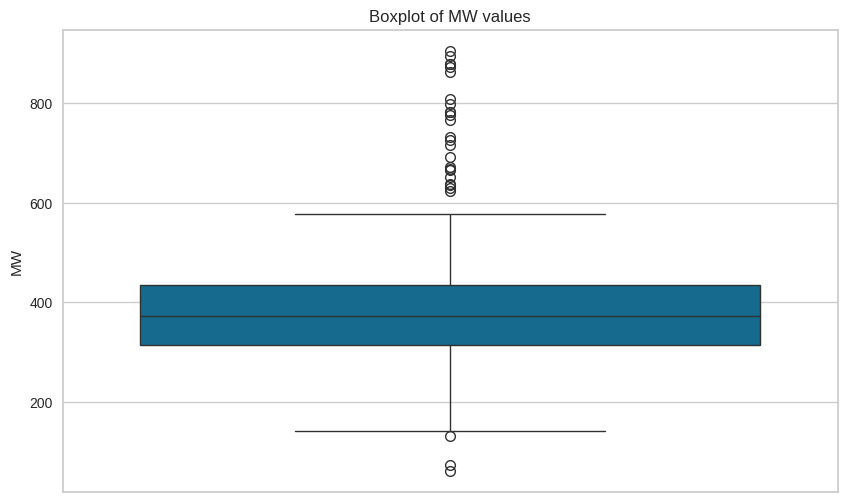

In [ ]:
# prompt: create boxlots

import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
sns.boxplot(data=db_treatment, y='MIC')
plt.title('Boxplot of MIC values')
plt.ylabel('MIC')
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=db_treatment, y='pMIC_ug/mL-1')
plt.title('Boxplot of pMIC_ug/mL-1 values')
plt.ylabel('pMIC_ug/mL-1')
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=db_treatment, y='pMIC_uM')
plt.title('Boxplot of pMIC_uM values')
plt.ylabel('pMIC_uM')
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=db_treatment, y='MW')
plt.title('Boxplot of MW values')
plt.ylabel('MW')
plt.show()

<a name='2'></a>

#**Sección 2. Diferencias de actividad**

<a name='2.1'></a>

## **Implementación 1: ciclo iterativo.**

Caso de ciclo iterativo para cada compuesto dentro de la base de datos pretratada.



Instrucciones propuestas: creación de una lista que almacena todos los posibles resultados de las comparaciones, posteriormente, se itera sobre cada uno de los compuestos dentro de la base; es decir, se inicia una instancia "for" que pretende recorrer/iterar todos los compuestos. Este ciclo, llamémosle "principal", tiene la funcionalidad de elegir un elemento fijo con el que se va a comparar con el resto de compuestos.

Dentro de esa misma instancia, se inicializa un "sub - ciclo" que pretende recorrer/iterar a la par del ciclo principal todos los compuestos de la base de datos pretratada. Sin embargo, este sub - ciclo tiene la característica de que la variable iterativa inicia una posición por delante del ciclo, pues este sub - ciclo va a comparar el elemento fijo que se elegió en el ciclo principal y el elemento variable que se eligió en este sub - ciclo.

Finalmente, las casos de comparación son almacenados en la lista que se creó en un principio.

In [ ]:
comparacion_actividad = [] #Lista donde se almacenaran las comparaciones

#Ciclo principal de iteración y elección del elemento fijo de comparación
for i in range(len(db_treatment)):
    elemento_fijo = db_treatment.iloc[i]   # nota: 'iloc' solo funciona para localización de datos tipo integers o booleanos.

      # Sub - ciclo: elección de elemento variable y comparación.
    for j in range(i+1, len(db_treatment)):    # "i+1" para asegurarnos de que se empieza a iterar un elemento después del 'elemento_fijo'.
        elemento_variable = db_treatment.iloc[j]

        # Comparación de valores de actividad.
        diferencia_actividad = abs(elemento_fijo["pMIC_uM"] - elemento_variable["pMIC_uM"])

        # Adición de los casos de comparación a la lista de resultados creada en el primer paso.
        comparacion_actividad.append({'Compuesto A': elemento_fijo['molecule_chembl_id'],
                                      'pMIC_uM A': elemento_fijo['pMIC_uM'],
                                      'Compuesto B': elemento_variable['molecule_chembl_id'],
                                      'pMIC_uM B': elemento_variable['pMIC_uM'],
                                      'Diferencia de actividad': diferencia_actividad})

# Dataframe con los resultados de comparación.
actividad_db = pd.DataFrame(comparacion_actividad)
actividad_db
# Nota: agregar sección de comprobación de n repeticiones posibles sin repetir. Comprobación  = n(n-1) / 2  ; donde "n" es el número de compuestos dentro de la base de datos.

,Compuesto A,pMIC_uM A,Compuesto B,pMIC_uM B,Diferencia de actividad
0,CHEMBL234895,1.653762,CHEMBL1362013,0.116083,1.537679
1,CHEMBL234895,1.653762,CHEMBL2435159,0.216537,1.437226
2,CHEMBL234895,1.653762,CHEMBL2435155,0.102405,1.551358
3,CHEMBL234895,1.653762,CHEMBL2435147,0.304720,1.349042
4,CHEMBL234895,1.653762,CHEMBL2435146,0.317488,1.336275
...,...,...,...,...,...
205756,CHEMBL2262377,-3.340168,CHEMBL2262373,-3.353710,0.013542
205757,CHEMBL2262377,-3.340168,CHEMBL2282790,-4.111440,0.771271
205758,CHEMBL2262374,-3.353710,CHEMBL2262373,-3.353710,0.000000
205759,CHEMBL2262374,-3.353710,CHEMBL2282790,-4.111440,0.757730


<Axes: ylabel='Diferencia de actividad'>

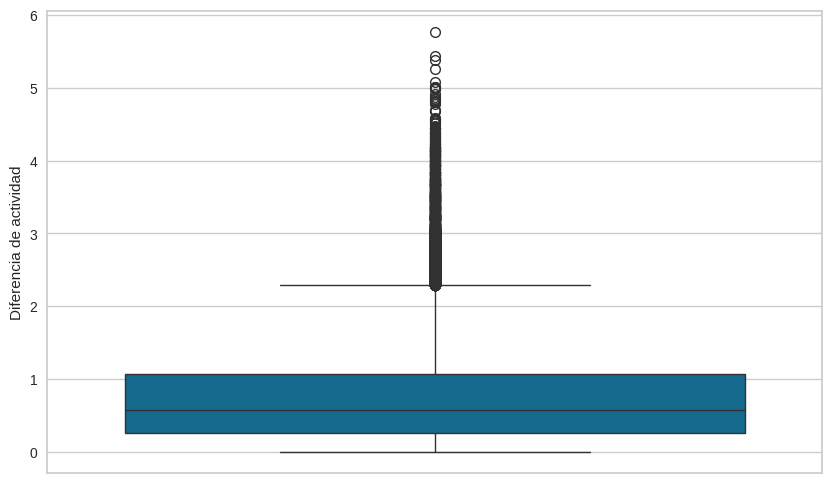

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=actividad_db, y='Diferencia de actividad')

<a name='2.2'></a>

##**Implementación 2: matriz comparativa**

Lo anterior se puede simplificar al genera una matriz comparativa considerando unicamente los valores de pMIC y el resultado de la diferencia de actividad.

In [ ]:
%%time
hmap=pd.DataFrame()
for i in db_treatment.index:
    for j in db_treatment.index:
        a = db_treatment.loc[i,'pMIC_uM'] #elemento fijo
        b = db_treatment.loc[j,'pMIC_uM'] #elemento variable
        diferencia_actividad = abs(a - b)
        hmap.loc[db_treatment.loc[i,'molecule_chembl_id'],db_treatment.loc[j,'molecule_chembl_id']]=diferencia_actividad
hmap

<a name='2.3'></a>

###**Visualización (Heat map)**

In [ ]:
palette= sns.blend_palette(['cyan','lightcyan','lightcoral', 'firebrick'],72)
palette

[(np.float64(0.0), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.031003460207612455), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.07234140715109573), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.10334486735870818), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.14468281430219146), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.18602076124567474), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.2170242214532872), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.25836216839677045), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.2893656286043829), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.33070357554786617), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.3720415224913495), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.40304498269896194), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.4443829296424452), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.47538638985005766), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.5167243367935409), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.5580622837370242), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.5890657439446366), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.6304036908881199), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.6614071510957323), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.7027450980392157), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.744083044982699), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.7750865051903114), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.8164244521337947), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.8474279123414069), np.float64(1.0), np.float64(1.0)),
 (np.float64(0.8791695501730104),
  np.float64(0.9941407151095732),
  np.float64(0.9941407151095732)),
 (np.float64(0.8821222606689735),
  np.float64(0.9707035755478662),
  np.float64(0.9707035755478662)),
 (np.float64(0.8843367935409457),
  np.float64(0.953125720876586),
  np.float64(0.953125720876586)),
 (np.float64(0.8872895040369089),
  np.float64(0.9296885813148789),
  np.float64(0.9296885813148789)),
 (np.float64(0.8895040369088811),
  np.float64(0.9121107266435986),
  np.float64(0.9121107266435986)),
 (np.float64(0.8924567474048443),
  np.float64(0.8886735870818916),
  np.float64(0.8886735870818916)),
 (np.float64(0.8954094579008074),
  np.float64(0.8652364475201846),
  np.float64(0.8652364475201846)),
 (np.float64(0.8976239907727797),
  np.float64(0.8476585928489042),
  np.float64(0.8476585928489042)),
 (np.float64(0.9005767012687428),
  np.float64(0.8242214532871972),
  np.float64(0.8242214532871972)),
 (np.float64(0.902791234140715),
  np.float64(0.806643598615917),
  np.float64(0.806643598615917)),
 (np.float64(0.9057439446366782),
  np.float64(0.78320645905421),
  np.float64(0.78320645905421)),
 (np.float64(0.9086966551326413),
  np.float64(0.7597693194925028),
  np.float64(0.7597693194925028)),
 (np.float64(0.9109111880046136),
  np.float64(0.7421914648212226),
  np.float64(0.7421914648212226)),
 (np.float64(0.9138638985005767),
  np.float64(0.7187543252595155),
  np.float64(0.7187543252595155)),
 (np.float64(0.9168166089965398),
  np.float64(0.6953171856978084),
  np.float64(0.6953171856978084)),
 (np.float64(0.9190311418685121),
  np.float64(0.6777393310265283),
  np.float64(0.6777393310265283)),
 (np.float64(0.9219838523644752),
  np.float64(0.6543021914648213),
  np.float64(0.6543021914648213)),
 (np.float64(0.9241983852364475),
  np.float64(0.6367243367935409),
  np.float64(0.6367243367935409)),
 (np.float64(0.9271510957324106),
  np.float64(0.6132871972318339),
  np.float64(0.6132871972318339)),
 (np.float64(0.9301038062283737),
  np.float64(0.5898500576701269),
  np.float64(0.5898500576701269)),
 (np.float64(0.932318339100346),
  np.float64(0.5722722029988466),
  np.float64(0.5722722029988466)),
 (np.float64(0.9352710495963091),
  np.float64(0.5488350634371395),
  np.float64(0.5488350634371395)),
 (np.float64(0.9374855824682814),
  np.float64(0.5312572087658594),
  np.float64(0.53125720876

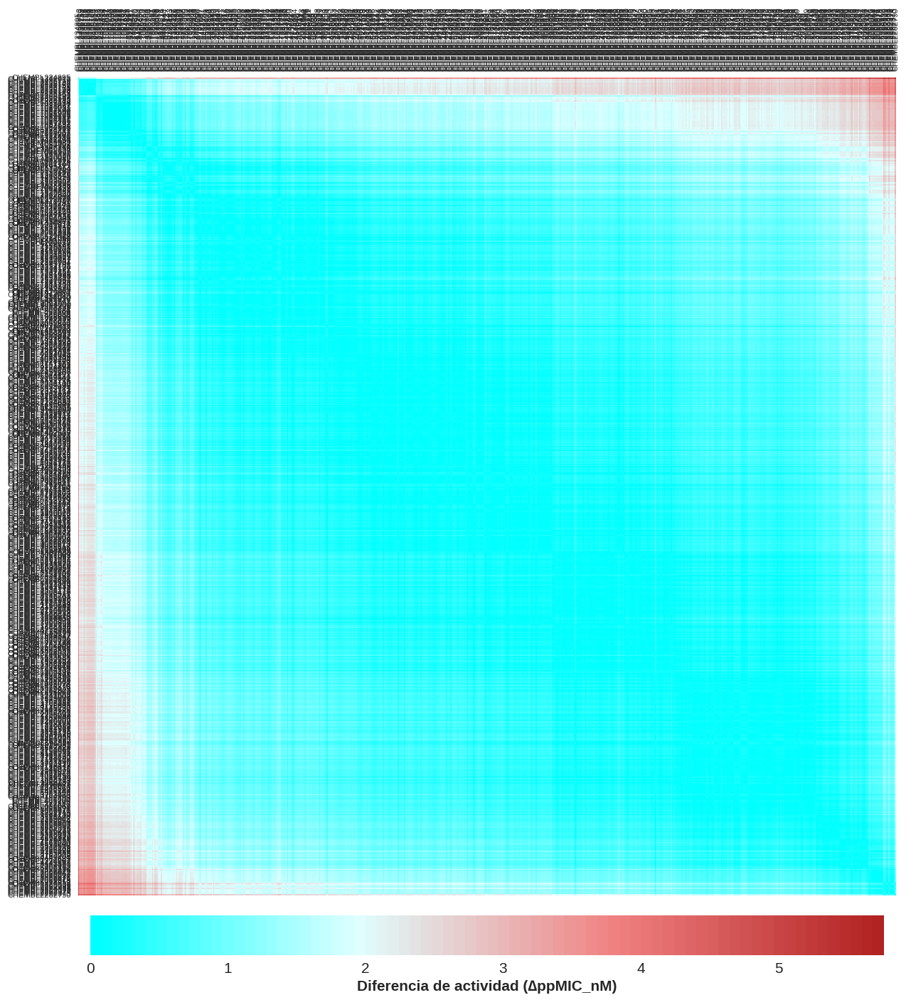

In [ ]:
fig, ax = plt.subplots(figsize=(18,18))
sns.heatmap(hmap,square = True, xticklabels=hmap.columns, yticklabels=hmap.index, cmap=palette,
            cbar_kws={'shrink':0.8,
                      'orientation':'horizontal','spacing':'uniform',
                      'pad':0.02})
ax.figure.axes[1].tick_params(axis="x", labelsize=15) #Tamaño de ticks en cbar
ax.figure.axes[1].set_xlabel('Diferencia de actividad (∆ppMIC_nM)', size=15, weight='bold') #Etiqueta de cbar
ax.tick_params(labelsize=1)
plt.xticks (np.arange(len(hmap.index))+0.5, hmap.index,rotation=90)
plt.yticks (np.arange(len(hmap.columns))+0.5, hmap.columns, rotation=0)
ax.xaxis.tick_top()
plt.tick_params ('both',width=1,labelsize=8)
plt.show()

In [ ]:
db_treatment.columns

Index(['molecule_chembl_id', 'MIC', 'InChI', 'MW', 'pMIC_ug/mL-1', 'pMIC_uM',
       'NEW_SMILES'],
      dtype='object')

<a name='3'></a>

#**Sección 3. Cálculo de similitud molecular.**

En esta sección se generara un loop iterativo para la obtención de fingerprints (radiales del tipo ECFP6 con ayuda de RDKit) y, posteriormente se empleará el coeficiente de Tanimoto para el establecimeinto del cálculo de similitud.

  Nota: pueden utilizarse otro tipo de representaciones moleculares, no necesariamente fingerprints ECFP6.


<a name='3.1'></a>
## **Implementación 1: ciclo iterativo.**

In [ ]:
tic =time.time()
comparacion_estructura = [] # Lista en donde se almacenan los casos de comparación.
for i in range(len(db_treatment)):
    elemento_fijo_id = db_treatment.loc[[i], ["molecule_chembl_id"]]
    elemento_fijo_df = db_treatment.loc[[i], ["NEW_SMILES"]]    # iteración sobre todos los compuestos de la base de datos, en este caso, su representación tipo SMILES.
    elemento_fijo_str = elemento_fijo_df.to_string(index = False, header = False)     # al recorrer/iterar sobre cada uno de los elementos, su reconocimiento no es directamente "string" (que es lo que necesitamos para el método 'GetMorgan'), sino que se obtiene como un "dataframe" por lo que el método "tostring" permite realizar esta conversión.
    elemento_fijo_mol = Chem.MolFromSmiles(elemento_fijo_str)    # al contar con el compuesto en su representación SMILES y en formato string, entoces podemos utilizar RDKit para generar un objeto tipo "mol".
    fps_elemento_fijo = AllChem.GetMorganFingerprintAsBitVect(elemento_fijo_mol, 2, nBits = 1024)  # Morgan toma ese objeto tipo mol y genera un fingerprint. Al mismo tiempo, al utilizar Morgan el usuario tiene que definir un radio a partir el cual se emplea para la generación del fingerprint: en este caso utilizamos "2". El término "n = 1024" es el tamaño del vector de bits generado.

    for j in range(i+1, len(db_treatment)):               #Sub ciclo donde se genera el fingerprint para "elemento_variable".

        elemento_variable_id = db_treatment.loc[[j], ["molecule_chembl_id"]]
        elemento_variable_df = db_treatment.loc[[j], ["NEW_SMILES"]]
        elemento_variable_str = elemento_variable_df.to_string(index = False, header = False)
        elemento_variable_mol = Chem.MolFromSmiles(elemento_variable_str)
        fps_elemento_variable = AllChem.GetMorganFingerprintAsBitVect(elemento_variable_mol, 3, nBits = 2048) #ECFP6

        diferencia_estructura = DataStructs.TanimotoSimilarity(fps_elemento_fijo, fps_elemento_variable)

        comparacion_estructura.append({"Compuesto A": elemento_fijo_id.to_string(index = False, header = False),
                                       "Smiles A": elemento_fijo_str,

                                      "Compuesto B": elemento_variable_id.to_string(index = False, header = False),
                                       "Smiles B": elemento_variable_str,

                                      "Similitud estructural (Tanimoto)": diferencia_estructura})

estructura_db = pd.DataFrame(comparacion_estructura)  # dataframe con todas las comparaciones posibles de similitud estructural.
toc =time.time()
print("Time: "+ str((toc-tic))+" s")
estructura_db

# Nota : esta sección de código puede reducirse en la parte de la conversión "dataframe" a "string". Si desde un principio en la base de datos pretratada especificamos "dtype=string" para la columna SMILES ya no es necesario realizar la conversión.

Time: 668.1632273197174 s


,Compuesto A,Smiles A,Compuesto B,Smiles B,Similitud estructural (Tanimoto)
0,CHEMBL234895,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL1362013,Oc1cc(-c2ccccc2)nc2nc3ccccc3n12,0.045455
1,CHEMBL234895,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL2435159,O=c1cc(-c2ccc(C(F)(F)F)cc2)nc2[nH]c3ccccc3n12,0.067568
2,CHEMBL234895,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL2435155,O=c1cc(C(F)(F)F)nc2[nH]c3ccccc3n12,0.079365
3,CHEMBL234895,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL2435147,CC(C)c1cc(=O)n2c3ccccc3n(Cc3cc(=O)oc4ccc(F)cc3...,0.065934
4,CHEMBL234895,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL2435146,COc1ccc2oc(=O)cc(Cn3c4ccccc4n4c(=O)cc(C(C)C)nc...,0.064516
...,...,...,...,...,...
205756,CHEMBL2262377,Cc1ccc2nc(Cl)c(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)...,CHEMBL2262373,Cc1ccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)N...,0.505618
205757,CHEMBL2262377,Cc1ccc2nc(Cl)c(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)...,CHEMBL2282790,Cc1ccc(S(=O)(=O)Oc2ccc(-c3nc4ccccc4c(=O)n3-c3c...,0.132743
205758,CHEMBL2262374,Cc1cccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)...,CHEMBL2262373,Cc1ccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)N...,0.540230
205759,CHEMBL2262374,Cc1cccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)...,CHEMBL2282790,Cc1ccc(S(=O)(=O)Oc2ccc(-c3nc4ccccc4c(=O)n3-c3c...,0.103448


<a name='3.1'></a>

##**Implementación 2: matriz de similitud**

In [ ]:
def tanimoto_calc(smi1, smi2):
    mol1 = Chem.MolFromSmiles(smi1)
    mol2 = Chem.MolFromSmiles(smi2)
    fp1 = AllChem.GetMorganFingerprintAsBitVect(mol1, 3, nBits=2048)
    fp2 = AllChem.GetMorganFingerprintAsBitVect(mol2, 3, nBits=2048)
    s = round(DataStructs.TanimotoSimilarity(fp1,fp2),3)
    return s

<a name='3.1'></a>
## **Implementación 1: ciclo iterativo.**

In [ ]:
db_treatment.sort_values(by=["molecule_chembl_id"], ascending=False, inplace=True) #Se ordena con respecto al ID para obtener una mejor visualización
db_treatment.reset_index(drop=True, inplace=True)

tic =time.time()
hmap_similarity=pd.DataFrame()
for i in db_treatment.index:
    for j in db_treatment.index:
        a=db_treatment.loc[i].at['NEW_SMILES']
        b=db_treatment.loc[j].at['NEW_SMILES']
        alignment= tanimoto_calc(a,b)
        hmap_similarity.loc[db_treatment.loc[i,'molecule_chembl_id'],db_treatment.loc[j,'molecule_chembl_id']]=alignment
toc =time.time()
print("Time: "+ str((toc-tic))+" s")

hmap_similarity

<ipython-input-21-a224ba1ec7f7>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  hmap_similarity.loc[db_treatment.loc[i,'molecule_chembl_id'],db_treatment.loc[j,'molecule_chembl_id']]=alignment
<ipython-input-21-a224ba1ec7f7>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  hmap_similarity.loc[db_treatment.loc[i,'molecule_chembl_id'],db_treatment.loc[j,'molecule_chembl_id']]=alignment
<ipython-input-21-a224ba1ec7f7>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` ma

Time: 1259.9022853374481 s


,CHEMBL91,CHEMBL75,CHEMBL70971,CHEMBL65709,CHEMBL638,CHEMBL604069,CHEMBL603654,CHEMBL603624,CHEMBL596511,CHEMBL595630,...,CHEMBL1084917,CHEMBL1082888,CHEMBL1082537,CHEMBL1082232,CHEMBL1082231,CHEMBL1082,CHEMBL1077071,CHEMBL1077037,CHEMBL106,CHEMBL104
CHEMBL91,1.000,0.221,0.054,0.075,0.099,0.079,0.075,0.070,0.073,0.067,...,0.092,0.062,0.071,0.084,0.068,0.073,0.130,0.047,0.097,0.172
CHEMBL75,0.221,1.000,0.090,0.072,0.090,0.097,0.071,0.145,0.085,0.102,...,0.086,0.070,0.089,0.093,0.074,0.101,0.122,0.063,0.079,0.123
CHEMBL70971,0.054,0.090,1.000,0.210,0.071,0.103,0.100,0.126,0.097,0.110,...,0.065,0.062,0.053,0.056,0.058,0.098,0.056,0.073,0.062,0.075
CHEMBL65709,0.075,0.072,0.210,1.000,0.080,0.098,0.106,0.118,0.093,0.104,...,0.092,0.085,0.079,0.084,0.087,0.114,0.083,0.098,0.062,0.085
CHEMBL638,0.099,0.090,0.071,0.080,1.000,0.083,0.060,0.083,0.077,0.071,...,0.070,0.068,0.083,0.062,0.064,0.087,0.070,0.076,0.486,0.100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CHEMBL1082,0.073,0.101,0.098,0.114,0.087,0.068,0.063,0.105,0.071,0.092,...,0.056,0.071,0.078,0.065,0.058,1.000,0.073,0.062,0.050,0.071
CHEMBL1077071,0.130,0.122,0.056,0.083,0.070,0.053,0.031,0.045,0.039,0.036,...,0.678,0.372,0.670,0.667,0.659,0.073,1.000,0.630,0.054,0.063
CHEMBL1077037,0.047,0.063,0.073,0.098,0.076,0.067,0.047,0.059,0.053,0.050,...,0.596,0.341,0.660,0.585,0.611,0.062,0.630,1.000,0.052,0.061
CHEMBL106,0.097,0.079,0.062,0.062,0.486,0.067,0.051,0.067,0.060,0.065,...,0.054,0.047,0.051,0.054,0.056,0.050,0.054,0.052,1.000,0.111


<a name='3.3'></a>

###**Visualización (Heat map)**

In [ ]:
palette= sns.blend_palette(['green','greenyellow','yellow', 'orange'],72)
palette

[(np.float64(0.0), np.float64(0.5019607843137255), np.float64(0.0)),
 (np.float64(0.023944636678200692),
  np.float64(0.5195386389850057),
  np.float64(0.006505190311418685)),
 (np.float64(0.05587081891580162),
  np.float64(0.5429757785467128),
  np.float64(0.015178777393310266)),
 (np.float64(0.07981545559400231),
  np.float64(0.5605536332179931),
  np.float64(0.02168396770472895)),
 (np.float64(0.11174163783160324),
  np.float64(0.5839907727797001),
  np.float64(0.03035755478662053)),
 (np.float64(0.14366782006920414),
  np.float64(0.6074279123414071),
  np.float64(0.039031141868512115)),
 (np.float64(0.16761245674740485),
  np.float64(0.6250057670126874),
  np.float64(0.0455363321799308)),
 (np.float64(0.1995386389850058),
  np.float64(0.6484429065743944),
  np.float64(0.05420991926182238)),
 (np.float64(0.22348327566320647),
  np.float64(0.6660207612456748),
  np.float64(0.06071510957324106)),
 (np.float64(0.2554094579008074),
  np.float64(0.6894579008073818),
  np.float64(0.06938869665513264)),
 (np.float64(0.2873356401384083),
  np.float64(0.7128950403690888),
  np.float64(0.07806228373702423)),
 (np.float64(0.311280276816609),
  np.float64(0.730472895040369),
  np.float64(0.0845674740484429)),
 (np.float64(0.34320645905420993),
  np.float64(0.7539100346020762),
  np.float64(0.0932410611303345)),
 (np.float64(0.3671510957324106),
  np.float64(0.7714878892733563),
  np.float64(0.09974625144175317)),
 (np.float64(0.3990772779700116),
  np.float64(0.7949250288350634),
  np.float64(0.10841983852364476)),
 (np.float64(0.43100346020761243),
  np.float64(0.8183621683967705),
  np.float64(0.11709342560553633)),
 (np.float64(0.4549480968858131),
  np.float64(0.8359400230680507),
  np.float64(0.12359861591695502)),
 (np.float64(0.486874279123414),
  np.float64(0.8593771626297577),
  np.float64(0.1322722029988466)),
 (np.float64(0.5108189158016148),
  np.float64(0.8769550173010381),
  np.float64(0.13877739331026528)),
 (np.float64(0.5427450980392158),
  np.float64(0.9003921568627451),
  np.float64(0.14745098039215687)),
 (np.float64(0.5746712802768166),
  np.float64(0.9238292964244521),
  np.float64(0.15612456747404846)),
 (np.float64(0.5986159169550173),
  np.float64(0.9414071510957325),
  np.float64(0.16262975778546712)),
 (np.float64(0.6305420991926183),
  np.float64(0.9648442906574395),
  np.float64(0.17130334486735874)),
 (np.float64(0.6544867358708188),
  np.float64(0.9824221453287196),
  np.float64(0.17780853517877737)),
 (np.float64(0.6822145328719723),
  np.float64(1.0),
  np.float64(0.1821453287197232)),
 (np.float64(0.6973471741637831),
  np.float64(1.0),
  np.float64(0.17347174163783163)),
 (np.float64(0.7086966551326414),
  np.float64(1.0),
  np.float64(0.16696655132641292)),
 (np.float64(0.7238292964244522),
  np.float64(1.0),
  np.float64(0.15829296424452136)),
 (np.float64(0.7351787773933103),
  np.float64(1.0),
  np.float64(0.15178777393310267)),
 (np.float64(0.7503114186851212),
  np.float64(1.0),
  np.float64(0.14311418685121108)),
 (np.float64(0.765444059976932),
  np.float64(1.0),
  np.float64(0.1344405997693195)),
 (np.float64(0.7767935409457901),
  np.float64(1.0),
  np.float64(0.1279354094579008)),
 (np.float64(0.7919261822376009),
  np.float64(1.0),
  np.float64(0.11926182237600923)),
 (np.float64(0.803275663206459),
  np.float64(1.0),
  np.float64(0.11275663206459055)),
 (np.float64(0.8184083044982698),
  np.float64(1.0),
  np.float64(0.10408304498269899)),
 (np.float64(0.8335409457900808),
  np.float64(1.0),
  np.float64(0.09540945790080739)),
 (np.float64(0.8448904267589389),
  np.float64(1.0),
  np.float64(0.0889042675893887)),
 (np.float64(0.8600230680507497),
  np.float64(1.0),
  np.float64(0.08023068050749713)),
 (np.float64(0.8751557093425606),
  np.float64(1.0),
  np.float64(0.07155709342560553)),
 (np.float64(0.8865051903114187),
  np.float64(1.0),
  np.float64(0.06505190311418685)),
 (np.float64(0.9016378316032295),
  np.float64(1.0),
  np.float64(0.05637831603229529)),
 (np.float64(0.91298731257

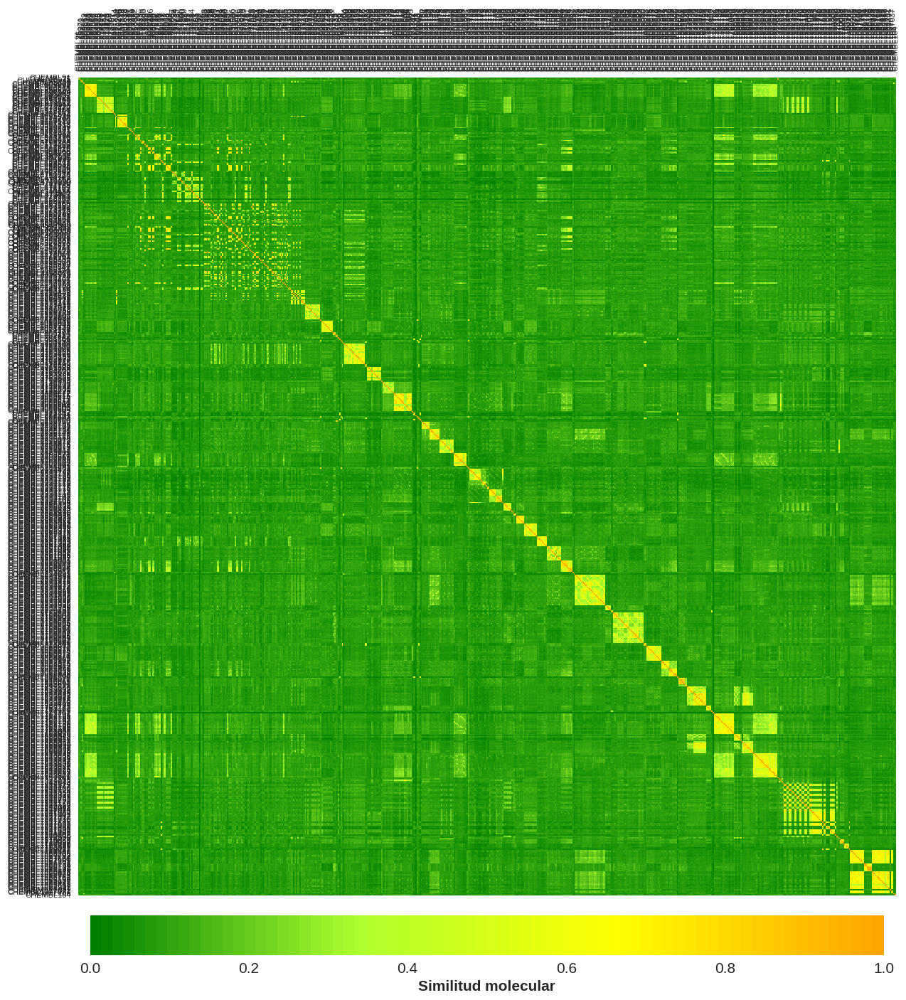

In [ ]:
fig, ax = plt.subplots(figsize=(18,18))
sns.heatmap(hmap_similarity,square = True, xticklabels=hmap_similarity.columns, yticklabels=hmap_similarity.index, cmap=palette,
            cbar_kws={'shrink':0.8,
                      'orientation':'horizontal','spacing':'uniform',
                      'pad':0.02})
ax.figure.axes[1].tick_params(axis="x", labelsize=15) #Tamaño de ticks en cbar
ax.figure.axes[1].set_xlabel('Similitud molecular', size=15, weight='bold') #Etiqueta de cbar
ax.tick_params(labelsize=1)
plt.xticks (np.arange(len(hmap_similarity.index))+0.5, hmap_similarity.index,rotation=90)
plt.yticks (np.arange(len(hmap_similarity.columns))+0.5, hmap_similarity.columns, rotation=0)
ax.xaxis.tick_top()
plt.tick_params ('both',width=1,labelsize=8)
plt.show()

### Determinación de valores SALI

Para cuantificar el panorama de actividad se emplea el indice SALI (Indice del panorama estructura-actividad):


```
# SALIi,j = |Ai − Aj|/1 − sim(i,j)

```
El valor SALI será empleado para mapear lo anterior en un mapa SAS usando una escala de color continua desde x(valores bajos SALI) hasta y (valores altos SALI asociados con ACs).
Para este segmento consideramos que dos compuestos están conectados si tienen un score SALI superior al limite de corte establecido (mayor al 70 u 80% de todos los scores)
https://pubs.rsc.org/en/content/articlehtml/2023/dd/d3dd00098b


In [ ]:
merge = actividad_db.merge(right=estructura_db, on=['Compuesto A', 'Compuesto B']) #Juntamos los DF
# Changed column names to match the keys from actividad_db
merge = merge[['Compuesto A',	'pMIC_uM A', 'Smiles A','Compuesto B',	'pMIC_uM B','Smiles B','Diferencia de actividad',	'Similitud estructural (Tanimoto)']]

# Changed column names to match the keys from actividad_db for rounding
merge['pMIC_uM A'] = merge['pMIC_uM A'].round(4)
merge['pMIC_uM B'] = merge['pMIC_uM B'].round(4)
merge['Diferencia de actividad'] = merge['Diferencia de actividad'].round(4)
merge['Similitud estructural (Tanimoto)'] = merge['Similitud estructural (Tanimoto)'].round(4)
merge['Valor de SALI'] = (merge['Diferencia de actividad'] / (1 - merge['Similitud estructural (Tanimoto)'])).round(4)   # para obtener el valor de SALi podemos usar la expresión aritmética directamente sin necesidad de iterar sobre todos los renglones de las columnas.

merge

,Compuesto A,pMIC_uM A,Smiles A,Compuesto B,pMIC_uM B,Smiles B,Diferencia de actividad,Similitud estructural (Tanimoto),Valor de SALI
0,CHEMBL234895,1.6538,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL1362013,0.1161,Oc1cc(-c2ccccc2)nc2nc3ccccc3n12,1.5377,0.0455,1.6110
1,CHEMBL234895,1.6538,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL2435159,0.2165,O=c1cc(-c2ccc(C(F)(F)F)cc2)nc2[nH]c3ccccc3n12,1.4372,0.0676,1.5414
2,CHEMBL234895,1.6538,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL2435155,0.1024,O=c1cc(C(F)(F)F)nc2[nH]c3ccccc3n12,1.5514,0.0794,1.6852
3,CHEMBL234895,1.6538,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL2435147,0.3047,CC(C)c1cc(=O)n2c3ccccc3n(Cc3cc(=O)oc4ccc(F)cc3...,1.3490,0.0659,1.4442
4,CHEMBL234895,1.6538,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL2435146,0.3175,COc1ccc2oc(=O)cc(Cn3c4ccccc4n4c(=O)cc(C(C)C)nc...,1.3363,0.0645,1.4284
...,...,...,...,...,...,...,...,...,...
205756,CHEMBL2262377,-3.3402,Cc1ccc2nc(Cl)c(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)...,CHEMBL2262373,-3.3537,Cc1ccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)N...,0.0135,0.5056,0.0273
205757,CHEMBL2262377,-3.3402,Cc1ccc2nc(Cl)c(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)...,CHEMBL2282790,-4.1114,Cc1ccc(S(=O)(=O)Oc2ccc(-c3nc4ccccc4c(=O)n3-c3c...,0.7713,0.1327,0.8893
205758,CHEMBL2262374,-3.3537,Cc1cccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)...,CHEMBL2262373,-3.3537,Cc1ccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)N...,0.0000,0.5402,0.0000
205759,CHEMBL2262374,-3.3537,Cc1cccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)...,CHEMBL2282790,-4.1114,Cc1ccc(S(=O)(=O)Oc2ccc(-c3nc4ccccc4c(=O)n3-c3c...,0.7577,0.1034,0.8451


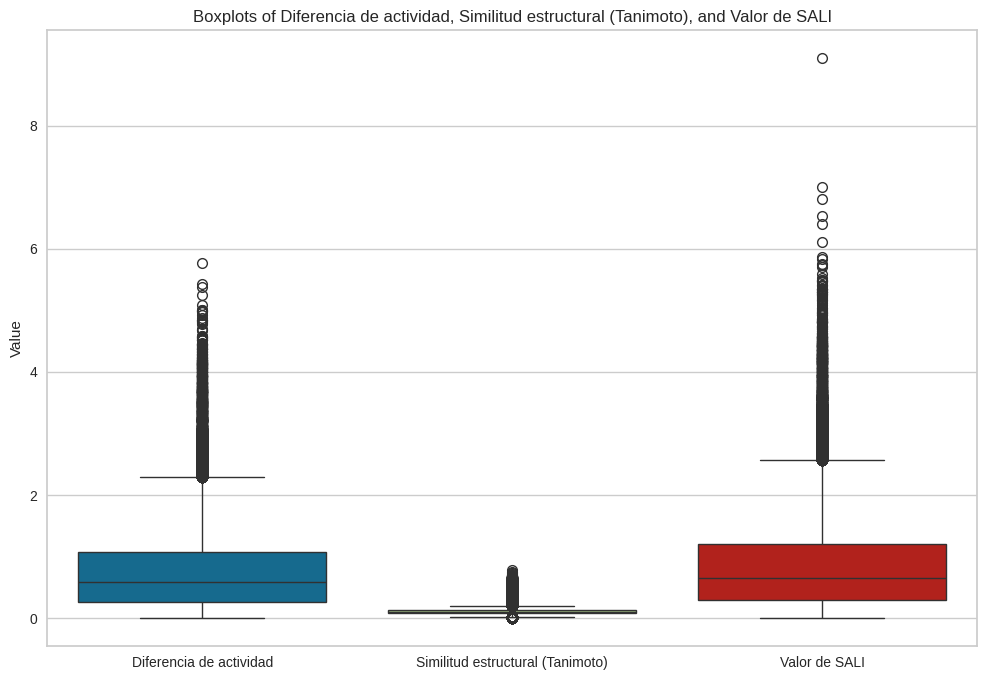

In [ ]:
# prompt: BOX PLOT, DE Diferencia de actividad 	Similitud estructural (Tanimoto) 	Valor de SALI, EN LA MISMA GRAFICA

import matplotlib.pyplot as plt
plt.figure(figsize=(12, 8))
sns.boxplot(data=merge[['Diferencia de actividad', 'Similitud estructural (Tanimoto)', 'Valor de SALI']])
plt.title('Boxplots of Diferencia de actividad, Similitud estructural (Tanimoto), and Valor de SALI')
plt.ylabel('Value')
plt.xticks(ticks=[0, 1, 2], labels=['Diferencia de actividad', 'Similitud estructural (Tanimoto)', 'Valor de SALI'])
plt.show()


<a name='4'></a>

#**Sección 4. Visualización y análisis de datos**
La elección de la métrica para definir si algo es un "*activity cliff*" (ACs) depende en gran medida del contexto específico del problema y de los objetivos. Sin embargo, algunas métricas comunes que son posibles de considerar son:


1. **Umbral Absoluto:** Puedes establecer un umbral absoluto para la diferencia de actividad y considerar cualquier diferencia que supere ese umbral como un "activity cliff". Por ejemplo, podrías decidir que cualquier diferencia mayor que 1.5 es un "*cliff*".

2. **Umbral Relativo:** En lugar de un umbral absoluto, podrías considerar un umbral relativo en función de la variabilidad de tus datos. Por ejemplo, podrías definir "*activity cliffs*" como aquellas diferencias que superan cierto múltiplo de la desviación estándar.

3. **Percentil:** Podrías identificar "*activity cliffs*" basándote en ciertos percentiles de la distribución de las diferencias. Por ejemplo, podrías considerar aquellos que están por encima del 90% superior como "*cliffs*".

4. **Criterios Biológicos o Químicos:** Dependiendo del dominio de tu problema, podrías incorporar conocimientos biológicos o químicos para definir "activity *cliffs*". Por ejemplo, podrías considerar como "*cliffs*" aquellas diferencias que conduzcan a cambios significativos en la estructura química.

In [ ]:
# Creamos el heatmap con Plotly
fig = go.Figure(data=go.Heatmap(
    z=merge["Valor de SALI"],
    x=merge["Compuesto B"],
    y=merge["Compuesto A"],
    hoverongaps=False
))

# Configuramos el layout
fig.update_layout(
    title='Heatmap del valor SALI',
    xaxis_title='Compuesto B',
    yaxis_title='Compuesto A'
)

# Mostramos el heatmap
fig.show()

<a name='4.1'></a>

##**SAS map o Panorama de actividad**

In [ ]:
fig_scatter = px.scatter(db_treatment,
                         x="molecule_chembl_id",
                         y="pMIC_uM",
                         title='Activity landscape',
                         width=1200,
                         height=800)
# This adds a dashed line for what a perfect model _should_ predict
y = db_treatment["pMIC_uM"].values
fig_scatter.show()

<ipython-input-33-8d54ea97d8d9>:11: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



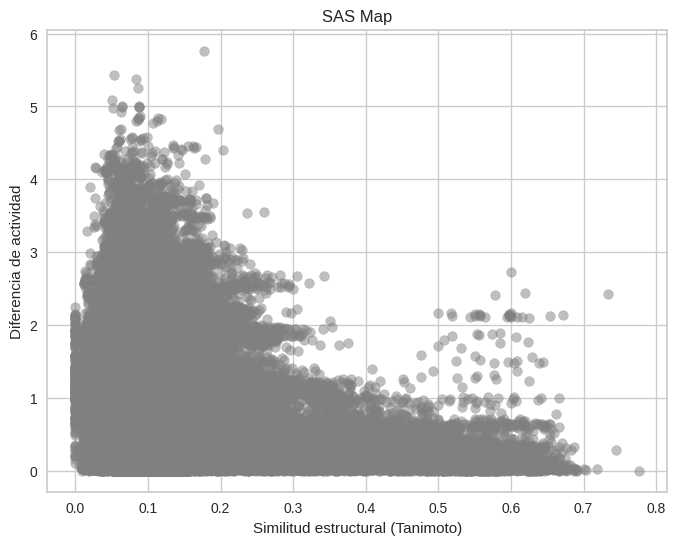

In [ ]:
# Datos del gráfico de dispersión
similitud = merge['Similitud estructural (Tanimoto)']
diferencia_actividad = merge['Diferencia de actividad']
# Crear el gráfico de dispersión
plt.figure(figsize=(8, 6))
plt.scatter(similitud, diferencia_actividad, color='gray', alpha=0.5)
plt.title('SAS Map')
plt.xlabel('Similitud estructural (Tanimoto)')
plt.ylabel('Diferencia de actividad')
plt.grid(True)
plt.legend()
plt.show()

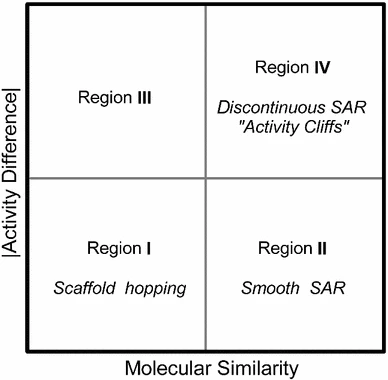

<a name='4.2'></a>
## **Identificación de "activity cliffs" (ACs).**

In [ ]:
def SAS_map(df, similarity_column, dif_activity_col, sali_col, umbral_x=None, umbral_y=None, set_title=str):
    # Crear el gráfico de dispersión
    plt.figure(figsize=(8, 6))
    sns.set(style="whitegrid", font_scale=1.2)

    plt.scatter(df[similarity_column], df[dif_activity_col], color='gray', alpha=0.2)

    # Si se proporcionan umbrales, identificar los puntos en el cuarto cuadrante
    if umbral_x is not None and umbral_y is not None:
        puntos_cuarto_cuadrante = df[(df[similarity_column] > umbral_x) & (df[dif_activity_col] > umbral_y)]
        plt.scatter(puntos_cuarto_cuadrante[similarity_column], puntos_cuarto_cuadrante[dif_activity_col],
                    c=puntos_cuarto_cuadrante[sali_col], cmap='coolwarm', s=100, alpha=0.8)
        plt.colorbar(label='SALI value')
        plt.axvline(x=umbral_x, color='red', linestyle='--', label='Umbral X')
        plt.axhline(y=umbral_y, color='blue', linestyle='--', label='Umbral Y')
    else:
        plt.scatter(df[similarity_column], df[dif_activity_col],
                    c=df[sali_col], cmap='coolwarm', s=100, alpha=0.8)
        plt.colorbar(label='SALI value')

    plt.title(set_title)
    plt.xlabel(similarity_column)
    plt.ylabel(dif_activity_col)
    plt.grid(True)
    plt.legend()
    return plt.show()

<ipython-input-34-253d3ffb9e28>:25: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



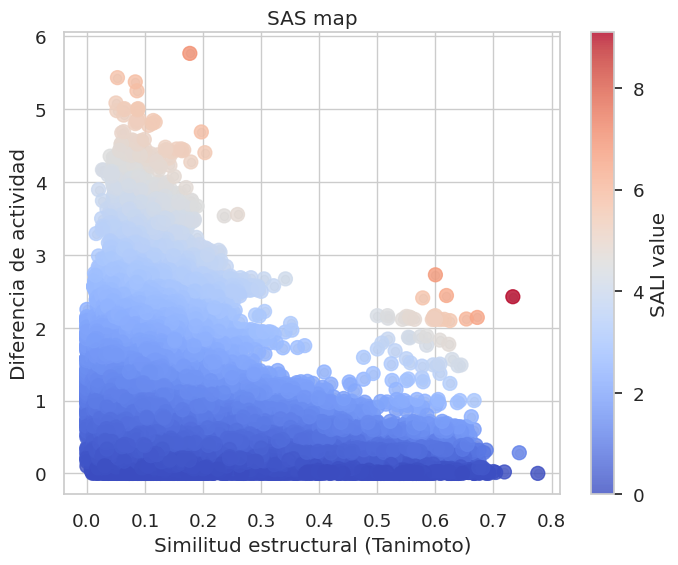

In [ ]:
# Ejemplo de uso sin umbrales
SAS_map(merge, similarity_column='Similitud estructural (Tanimoto)', dif_activity_col='Diferencia de actividad',
        sali_col='Valor de SALI', set_title= 'SAS map')

[0.7763, 0.7444, 0.7333, 0.7188, 0.7037, 0.7, 0.6914, 0.6914, 0.6892, 0.6875, 0.6875, 0.6875, 0.6867, 0.6849, 0.6833, 0.6818, 0.679, 0.679, 0.6757, 0.6753, 0.6753, 0.675, 0.675, 0.675, 0.675, 0.6747, 0.6721, 0.6719, 0.6719, 0.6712, 0.6706, 0.6698, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6627, 0.6625, 0.662, 0.662, 0.6618, 0.6618, 0.6615, 0.6598, 0.6596, 0.6588, 0.6585, 0.6585, 0.6582, 0.6575, 0.6575, 0.6575, 0.6571, 0.6557, 0.6552, 0.6548, 0.6548, 0.6548, 0.6548, 0.6543, 0.6543, 0.6538, 0.6533, 0.6533, 0.6528, 0.6528, 0.6522, 0.6522, 0.6522, 0.6515, 0.6512, 0.6512, 0.6512, 0.6506, 0.6506, 0.65, 0.65, 0.65, 0.65, 0.65, 0.65, 0.65, 0.6491, 0.6491, 0.6486, 0.6486, 0.6486, 0.6481, 0.6475, 0.6471, 0.6471, 0.6471, 0.6465, 0.6463, 0.6452, 0.6452, 0.6452, 0.6447, 0.6447, 0.6446, 0.6441, 0.6438, 0.6438, 0.6437, 0.6437, 0.6436, 0.6429, 0.6429, 0.6429, 0.6429, 0.6429, 0.642, 0.642, 0.642, 0.6417, 0.641, 0.64, 0.6395, 0.6395, 0.6395, 0.6395

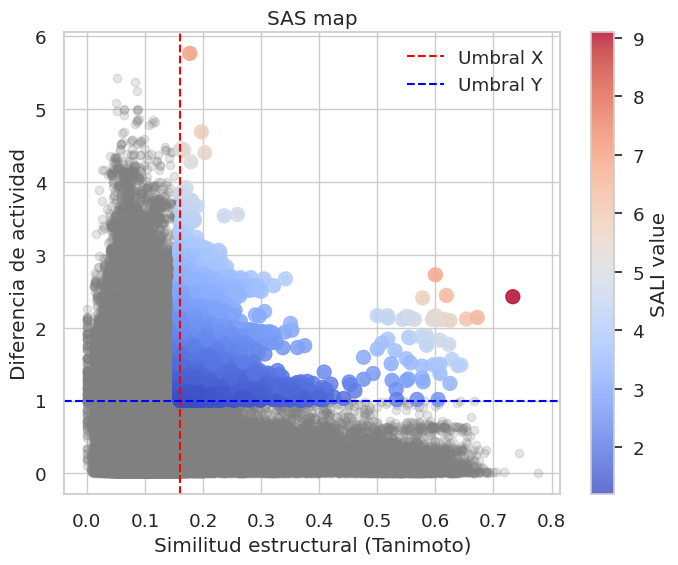

In [ ]:
'''
El umbral X calculado representa el valor de similitud estructural por encima del cual se encuentran el 10 %
de los pares con la mayor similitud en la base de datos.
El umbral Y corresponde a una unidad logarítmica
'''
similarity_scores=merge['Similitud estructural (Tanimoto)'].tolist()
top_10_percent = int(0.1 * len(similarity_scores)) # Calcula el número de pares en el 10 % superior
sorted_similarity_scores = sorted(similarity_scores, reverse=True) # Ordena las similitudes estructurales de mayor a menor
print(sorted_similarity_scores)
umbral_x = sorted_similarity_scores[top_10_percent - 1] # #El percentil 10 de los compuestos con mayor similitud.
print("Umbral del top 10 %:", umbral_x)
umbral_y = 1  # 1 unidad logarítmica
# Ejemplo de uso con umbrales
SAS_map(merge, similarity_column='Similitud estructural (Tanimoto)', dif_activity_col='Diferencia de actividad',
        sali_col='Valor de SALI', umbral_x=umbral_x, umbral_y=umbral_y, set_title='SAS map')

[0.7763, 0.7444, 0.7333, 0.7188, 0.7037, 0.7, 0.6914, 0.6914, 0.6892, 0.6875, 0.6875, 0.6875, 0.6867, 0.6849, 0.6833, 0.6818, 0.679, 0.679, 0.6757, 0.6753, 0.6753, 0.675, 0.675, 0.675, 0.675, 0.6747, 0.6721, 0.6719, 0.6719, 0.6712, 0.6706, 0.6698, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6667, 0.6627, 0.6625, 0.662, 0.662, 0.6618, 0.6618, 0.6615, 0.6598, 0.6596, 0.6588, 0.6585, 0.6585, 0.6582, 0.6575, 0.6575, 0.6575, 0.6571, 0.6557, 0.6552, 0.6548, 0.6548, 0.6548, 0.6548, 0.6543, 0.6543, 0.6538, 0.6533, 0.6533, 0.6528, 0.6528, 0.6522, 0.6522, 0.6522, 0.6515, 0.6512, 0.6512, 0.6512, 0.6506, 0.6506, 0.65, 0.65, 0.65, 0.65, 0.65, 0.65, 0.65, 0.6491, 0.6491, 0.6486, 0.6486, 0.6486, 0.6481, 0.6475, 0.6471, 0.6471, 0.6471, 0.6465, 0.6463, 0.6452, 0.6452, 0.6452, 0.6447, 0.6447, 0.6446, 0.6441, 0.6438, 0.6438, 0.6437, 0.6437, 0.6436, 0.6429, 0.6429, 0.6429, 0.6429, 0.6429, 0.642, 0.642, 0.642, 0.6417, 0.641, 0.64, 0.6395, 0.6395, 0.6395, 0.6395

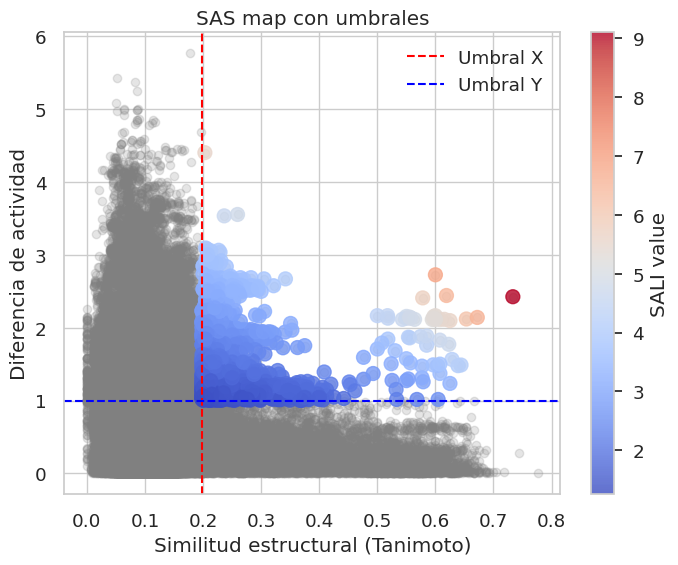

In [ ]:
# prompt: CALCULA El umbral X calculado representa el valor de similitud estructural por encima del cual se encuentran el 5 %
# de los pares con la mayor similitud en la base de datos.
# El umbral Y corresponde a una unidad logarítmica

'''
El umbral X calculado representa el valor de similitud estructural por encima del cual se encuentran el 5 %
de los pares con la mayor similitud en la base de datos.
El umbral Y corresponde a una unidad logarítmica
'''
similarity_scores=merge['Similitud estructural (Tanimoto)'].tolist()
top_5_percent = int(0.05 * len(similarity_scores)) # Calcula el número de pares en el 5 % superior
sorted_similarity_scores = sorted(similarity_scores, reverse=True) # Ordena las similitudes estructurales de mayor a menor
print(sorted_similarity_scores)
umbral_x = sorted_similarity_scores[top_5_percent - 1] # El percentil 5 de los compuestos con mayor similitud.
print("Umbral del top 5 %:", umbral_x)
umbral_y = 1  # 1 unidad logarítmica

# Ejemplo de uso con umbrales
SAS_map(merge, similarity_column='Similitud estructural (Tanimoto)', dif_activity_col='Diferencia de actividad',
        sali_col='Valor de SALI', umbral_x=umbral_x, umbral_y=umbral_y, set_title='SAS map con umbrales')


In [ ]:
print(f"Estadística de la columna 'Diferencia de actividad': {merge['Diferencia de actividad'].describe()}")
print(f"Estadística de la columna 'Similitud estructural (Tanimoto)': {merge['Similitud estructural (Tanimoto)'].describe()}")
print(f"Estadística de la columna 'Valor de SALI': {merge['Valor de SALI'].describe()}")

Estadística de la columna 'Diferencia de actividad': count    205761.000000
mean          0.764900
std           0.661936
min           0.000000
25%           0.266300
50%           0.582500
75%           1.075600
max           5.765200
Name: Diferencia de actividad, dtype: float64
Estadística de la columna 'Similitud estructural (Tanimoto)': count    205761.000000
mean          0.115159
std           0.066129
min           0.000000
25%           0.083300
50%           0.103800
75%           0.127900
max           0.776300
Name: Similitud estructural (Tanimoto), dtype: float64
Estadística de la columna 'Valor de SALI': count    205761.000000
mean          0.861977
std           0.742584
min           0.000000
25%           0.302800
50%           0.659600
75%           1.208300
max           9.093000
Name: Valor de SALI, dtype: float64


Considerando la información anterior, podemos establecer dos tipos de umbrales, unos absolutos (25%, 50%, 75%) y unos realtivos considerando:
1. Diferencia de Actividad (pMIC):
    - Dado que la media es 0.764900 y la desviación estándar es 0.661936, se podría considerar umbrales que estén en el rango de 1 a 2 desviaciones estándar de la media.
    Por ejemplo, podriamos definir como "alta" diferencia de actividad aquellas mayores que, por ejemplo, 2.0 (media + 2 * desviación estándar).
2. Similitud Estructural (Tanimoto):
  - Podrías definir como "alta" similitud aquella mayor que, por ejemplo, 0.132258 (media + 2 * desviación estándar).

<a name='4.2.1'></a>

### **Establecimiento de umbrales relativos y absolutos**

In [ ]:
#Umbrales absolutos--->  considerando el 25%, 50% y 75% en ambos casos
thresholds_ActivityDiff_25= 0.266300
thresholds_Similarity_25 = 0.083300
thresholds_ActivityDiff_50= 0.582500
thresholds_Similarity_50 = 0.103800
thresholds_ActivityDiff_75= 1.075600
thresholds_Similarity_75 = 0.127900

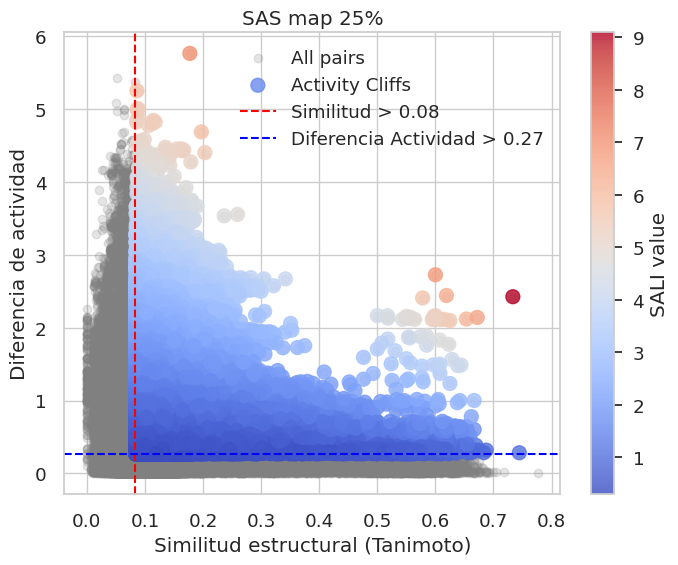

In [ ]:
# Ejemplo de uso con umbrales
SAS_map(merge, similarity_column='Similitud estructural (Tanimoto)', dif_activity_col='Diferencia de actividad',
        sali_col='Valor de SALI', umbral_x=thresholds_Similarity_25, umbral_y=thresholds_ActivityDiff_25, set_title='SAS map 25%')

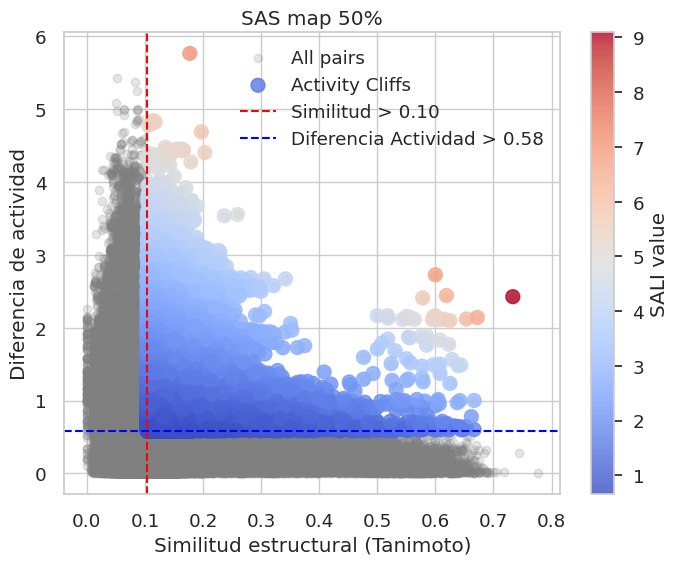

In [ ]:
# Ejemplo de uso con umbrales
SAS_map(merge, similarity_column='Similitud estructural (Tanimoto)', dif_activity_col='Diferencia de actividad',
        sali_col='Valor de SALI', umbral_x=thresholds_Similarity_50, umbral_y=thresholds_ActivityDiff_50, set_title='SAS map 50%')

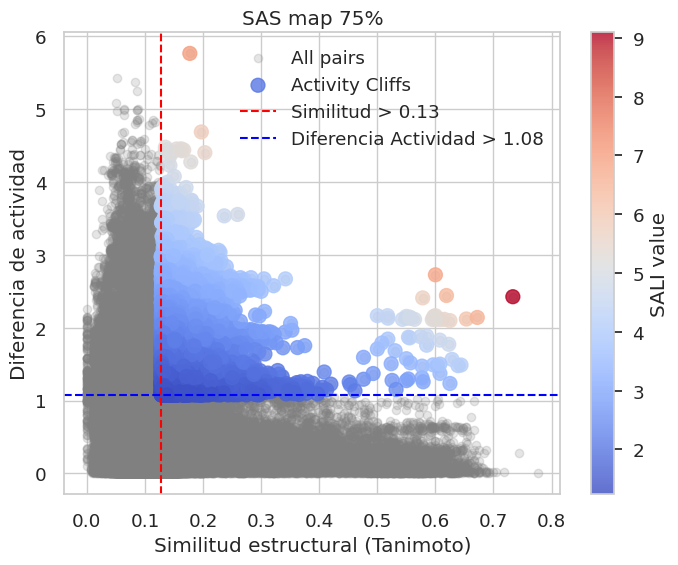

In [ ]:
# Ejemplo de uso con umbrales
SAS_map(merge, similarity_column='Similitud estructural (Tanimoto)', dif_activity_col='Diferencia de actividad',
        sali_col='Valor de SALI', umbral_x=thresholds_Similarity_75, umbral_y=thresholds_ActivityDiff_75, set_title='SAS map 75%')

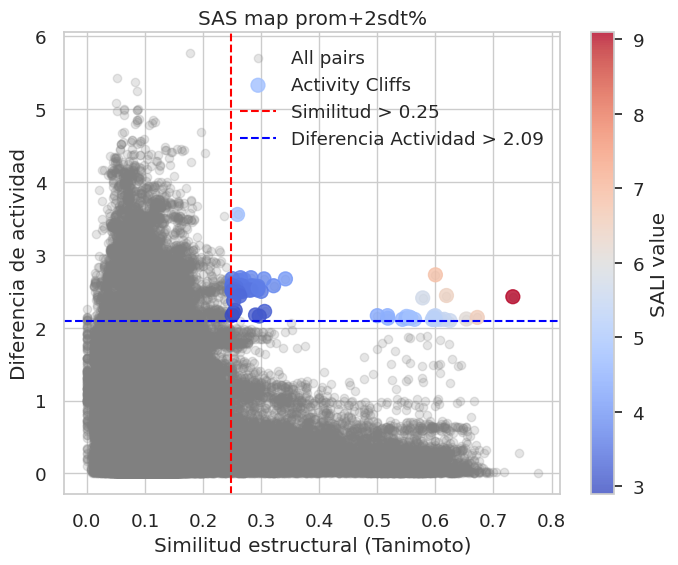

In [ ]:
#Umbrales Relativos considerando promedio + 2 veces la desviación estandar
thresholds_ActivityDiff_rel= merge['Diferencia de actividad'].mean() + 2 * merge['Diferencia de actividad'].std()
thresholds_Similarity = merge['Similitud estructural (Tanimoto)'].mean() + 2 * merge['Similitud estructural (Tanimoto)'].std()
# Ejemplo de uso con umbrales
SAS_map(merge, similarity_column='Similitud estructural (Tanimoto)', dif_activity_col='Diferencia de actividad',
        sali_col='Valor de SALI', umbral_x=thresholds_Similarity, umbral_y=thresholds_ActivityDiff_rel, set_title='SAS map prom+2sdt%')

Número de pares considerados Activity Cliffs: 64
Compuesto A: CHEMBL234895 (pMIC: 1.6538)
Compuesto B: CHEMBL5419490 (pMIC: -1.9004)
Diferencia de actividad: 3.5542
Similitud estructural (Tanimoto): 0.2593
Valor de SALI: 4.7984


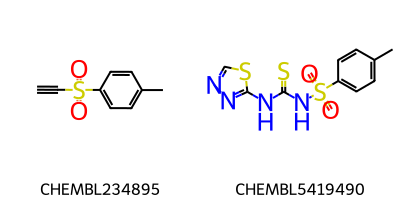

------------------------------
Compuesto A: CHEMBL2435147 (pMIC: 0.3047)
Compuesto B: CHEMBL2234662 (pMIC: -2.3425)
Diferencia de actividad: 2.6472
Similitud estructural (Tanimoto): 0.2619
Valor de SALI: 3.5865


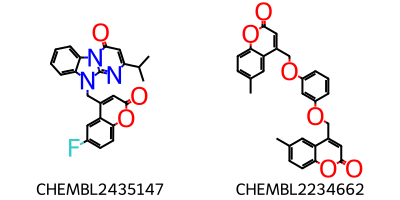

------------------------------
Compuesto A: CHEMBL2435146 (pMIC: 0.3175)
Compuesto B: CHEMBL2234655 (pMIC: -2.2483)
Diferencia de actividad: 2.5658
Similitud estructural (Tanimoto): 0.2556
Valor de SALI: 3.4468


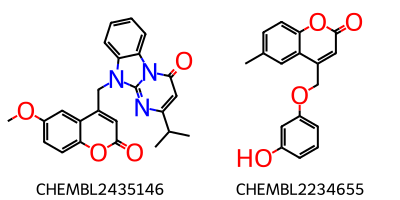

------------------------------
Compuesto A: CHEMBL2435146 (pMIC: 0.3175)
Compuesto B: CHEMBL2234662 (pMIC: -2.3425)
Diferencia de actividad: 2.66
Similitud estructural (Tanimoto): 0.2706
Valor de SALI: 3.6468


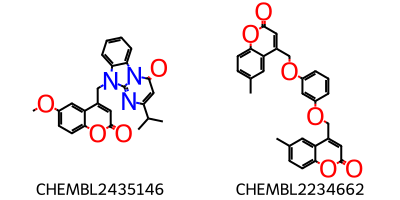

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234655 (pMIC: -2.2483)
Diferencia de actividad: 2.576
Similitud estructural (Tanimoto): 0.3214
Valor de SALI: 3.7961


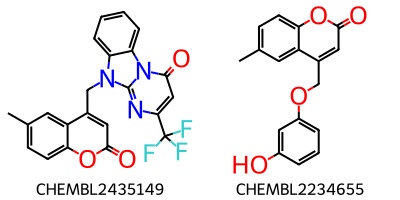

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234670 (pMIC: -2.1893)
Diferencia de actividad: 2.517
Similitud estructural (Tanimoto): 0.2632
Valor de SALI: 3.4161


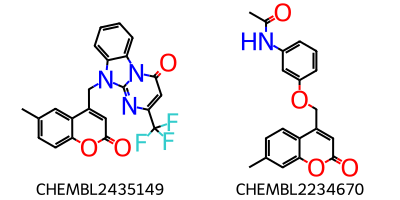

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234669 (pMIC: -2.1893)
Diferencia de actividad: 2.517
Similitud estructural (Tanimoto): 0.2935
Valor de SALI: 3.5626


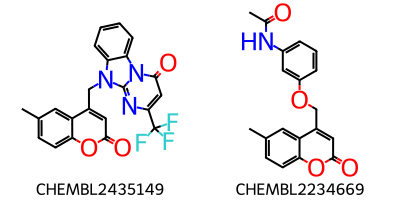

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234656 (pMIC: -2.2483)
Diferencia de actividad: 2.576
Similitud estructural (Tanimoto): 0.2874
Valor de SALI: 3.6149


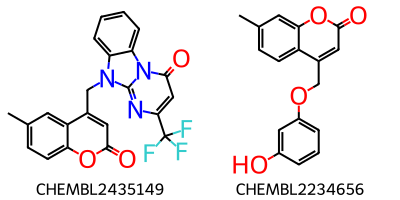

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234677 (pMIC: -2.1708)
Diferencia de actividad: 2.4985
Similitud estructural (Tanimoto): 0.2688
Valor de SALI: 3.417


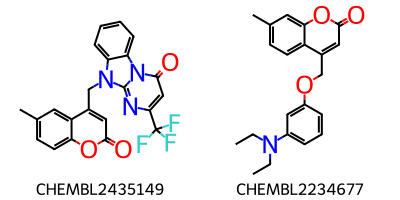

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234676 (pMIC: -2.1708)
Diferencia de actividad: 2.4985
Similitud estructural (Tanimoto): 0.3
Valor de SALI: 3.5693


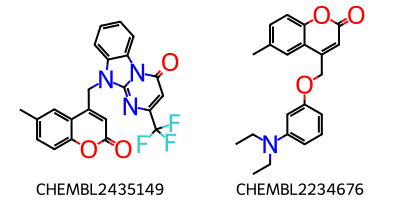

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234662 (pMIC: -2.3425)
Diferencia de actividad: 2.6702
Similitud estructural (Tanimoto): 0.3418
Valor de SALI: 4.0568


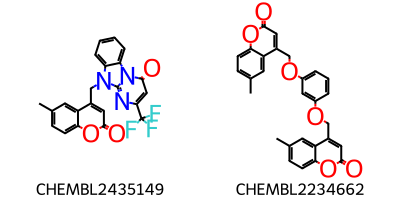

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234663 (pMIC: -2.3425)
Diferencia de actividad: 2.6702
Similitud estructural (Tanimoto): 0.3049
Valor de SALI: 3.8415


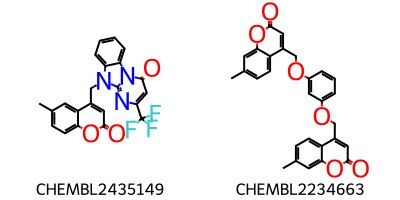

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234661 (pMIC: -1.8574)
Diferencia de actividad: 2.2012
Similitud estructural (Tanimoto): 0.2527
Valor de SALI: 2.9455


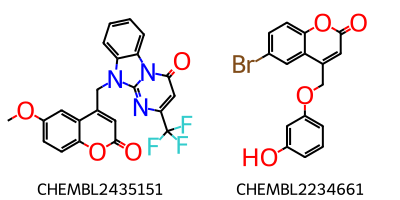

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234678 (pMIC: -1.8257)
Diferencia de actividad: 2.1695
Similitud estructural (Tanimoto): 0.25
Valor de SALI: 2.8927


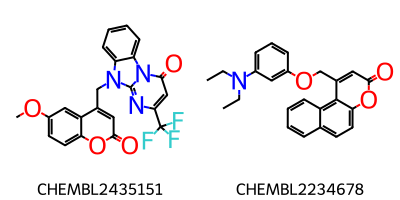

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234657 (pMIC: -1.8951)
Diferencia de actividad: 2.2388
Similitud estructural (Tanimoto): 0.2553
Valor de SALI: 3.0063


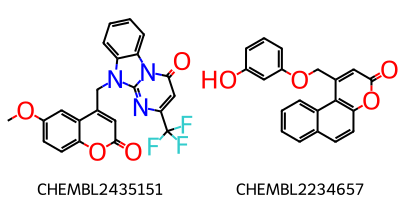

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2429909 (pMIC: -2.0264)
Diferencia de actividad: 2.3702
Similitud estructural (Tanimoto): 0.2527
Valor de SALI: 3.1717


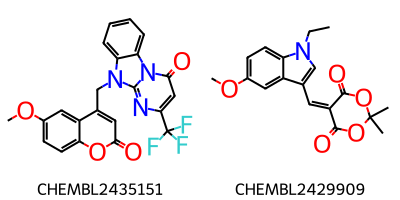

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234655 (pMIC: -2.2483)
Diferencia de actividad: 2.592
Similitud estructural (Tanimoto): 0.2667
Valor de SALI: 3.5347


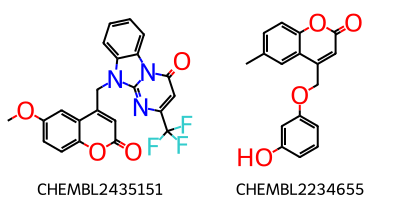

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234656 (pMIC: -2.2483)
Diferencia de actividad: 2.592
Similitud estructural (Tanimoto): 0.25
Valor de SALI: 3.456


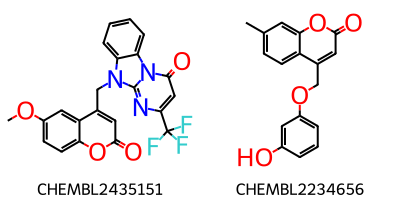

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234676 (pMIC: -2.1708)
Diferencia de actividad: 2.5146
Similitud estructural (Tanimoto): 0.25
Valor de SALI: 3.3528


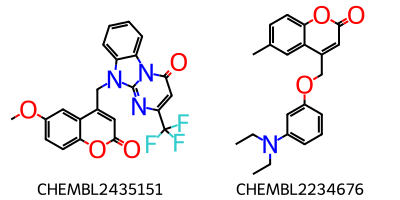

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234662 (pMIC: -2.3425)
Diferencia de actividad: 2.6863
Similitud estructural (Tanimoto): 0.2824
Valor de SALI: 3.7435


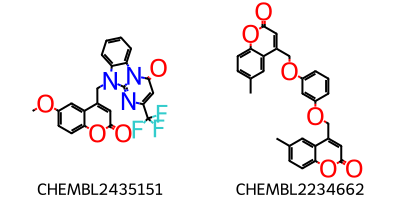

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234663 (pMIC: -2.3425)
Diferencia de actividad: 2.6863
Similitud estructural (Tanimoto): 0.2644
Valor de SALI: 3.6518


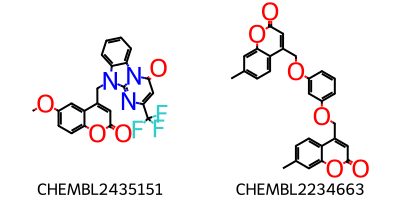

------------------------------
Compuesto A: CHEMBL2435150 (pMIC: 0.3318)
Compuesto B: CHEMBL2234662 (pMIC: -2.3425)
Diferencia de actividad: 2.6742
Similitud estructural (Tanimoto): 0.25
Valor de SALI: 3.5656


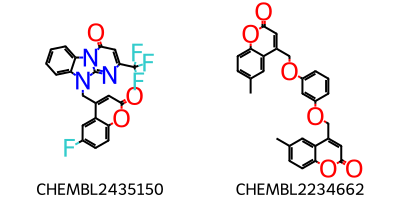

------------------------------
Compuesto A: CHEMBL2435144 (pMIC: 0.3658)
Compuesto B: CHEMBL2234675 (pMIC: -1.8089)
Diferencia de actividad: 2.1747
Similitud estructural (Tanimoto): 0.2903
Valor de SALI: 3.0643


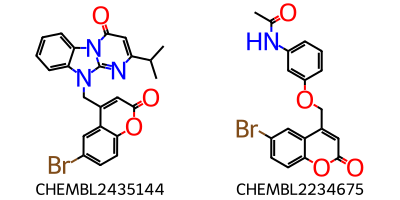

------------------------------
Compuesto A: CHEMBL2435144 (pMIC: 0.3658)
Compuesto B: CHEMBL2234661 (pMIC: -1.8574)
Diferencia de actividad: 2.2232
Similitud estructural (Tanimoto): 0.3059
Valor de SALI: 3.203


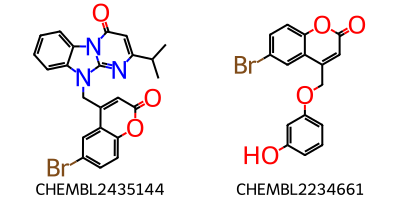

------------------------------
Compuesto A: CHEMBL2435144 (pMIC: 0.3658)
Compuesto B: CHEMBL2234682 (pMIC: -1.7934)
Diferencia de actividad: 2.1592
Similitud estructural (Tanimoto): 0.2967
Valor de SALI: 3.0701


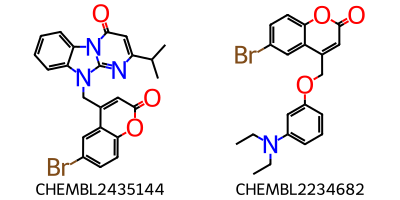

------------------------------
Compuesto A: CHEMBL5427814 (pMIC: -0.3071)
Compuesto B: CHEMBL5395033 (pMIC: -2.749)
Diferencia de actividad: 2.4418
Similitud estructural (Tanimoto): 0.619
Valor de SALI: 6.4089


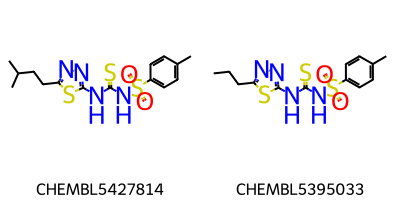

------------------------------
Compuesto A: CHEMBL5427814 (pMIC: -0.3071)
Compuesto B: CHEMBL5401312 (pMIC: -3.0332)
Diferencia de actividad: 2.7261
Similitud estructural (Tanimoto): 0.6
Valor de SALI: 6.8152


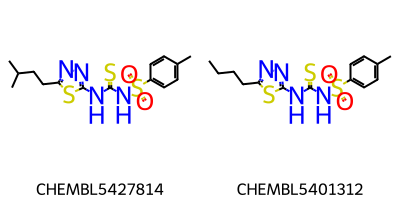

------------------------------
Compuesto A: CHEMBL1085158 (pMIC: -0.3815)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1306
Similitud estructural (Tanimoto): 0.557
Valor de SALI: 4.8095


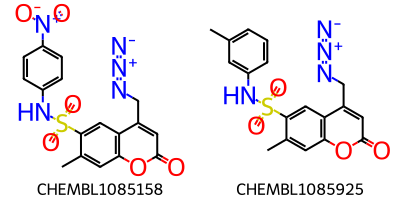

------------------------------
Compuesto A: CHEMBL1077071 (pMIC: -0.3573)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1548
Similitud estructural (Tanimoto): 0.55
Valor de SALI: 4.7884


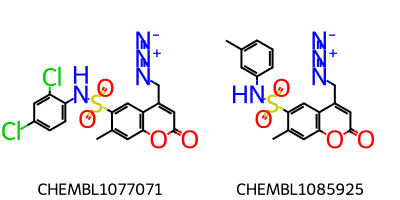

------------------------------
Compuesto A: CHEMBL1088487 (pMIC: -0.3825)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1296
Similitud estructural (Tanimoto): 0.55
Valor de SALI: 4.7324


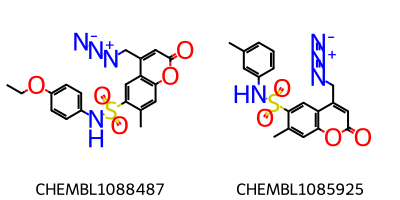

------------------------------
Compuesto A: CHEMBL1077037 (pMIC: -0.3815)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1306
Similitud estructural (Tanimoto): 0.5181
Valor de SALI: 4.4212


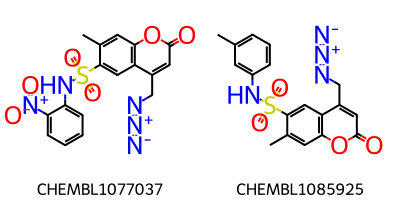

------------------------------
Compuesto A: CHEMBL1082231 (pMIC: -0.3475)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1646
Similitud estructural (Tanimoto): 0.6
Valor de SALI: 5.4115


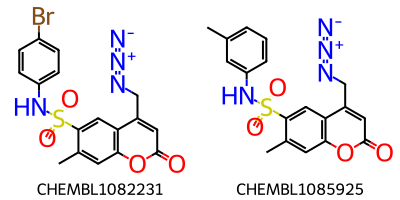

------------------------------
Compuesto A: CHEMBL1082232 (pMIC: -0.3779)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1342
Similitud estructural (Tanimoto): 0.5974
Valor de SALI: 5.301


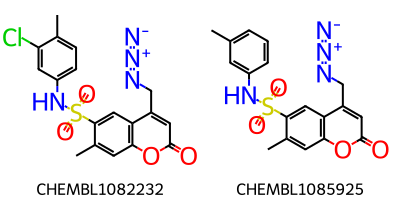

------------------------------
Compuesto A: CHEMBL1087560 (pMIC: -0.3975)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1146
Similitud estructural (Tanimoto): 0.5432
Valor de SALI: 4.6292


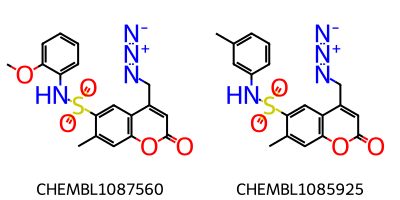

------------------------------
Compuesto A: CHEMBL1087559 (pMIC: -0.3996)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1125
Similitud estructural (Tanimoto): 0.5946
Valor de SALI: 5.2109


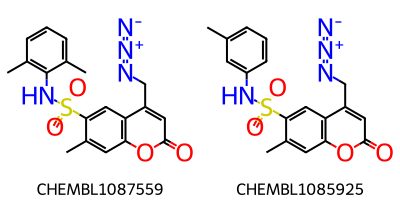

------------------------------
Compuesto A: CHEMBL1085926 (pMIC: -0.4152)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.0969
Similitud estructural (Tanimoto): 0.625
Valor de SALI: 5.5917


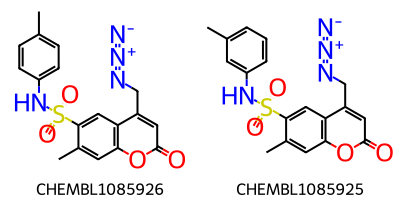

------------------------------
Compuesto A: CHEMBL1088205 (pMIC: -0.3996)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1125
Similitud estructural (Tanimoto): 0.6081
Valor de SALI: 5.3904


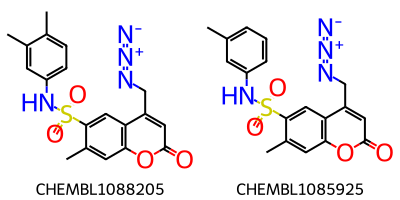

------------------------------
Compuesto A: CHEMBL1085166 (pMIC: -0.3927)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1194
Similitud estructural (Tanimoto): 0.6
Valor de SALI: 5.2985


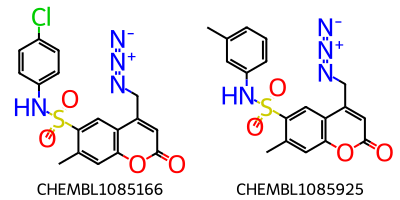

------------------------------
Compuesto A: CHEMBL1084917 (pMIC: -0.3927)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1194
Similitud estructural (Tanimoto): 0.6533
Valor de SALI: 6.1131


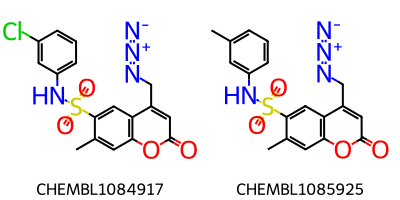

------------------------------
Compuesto A: CHEMBL1087561 (pMIC: -0.3975)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1146
Similitud estructural (Tanimoto): 0.6154
Valor de SALI: 5.4982


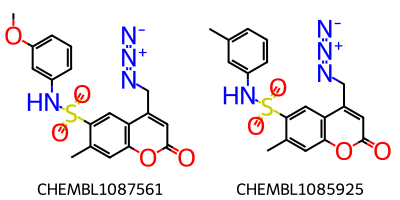

------------------------------
Compuesto A: CHEMBL1088486 (pMIC: -0.3975)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1146
Similitud estructural (Tanimoto): 0.5641
Valor de SALI: 4.8511


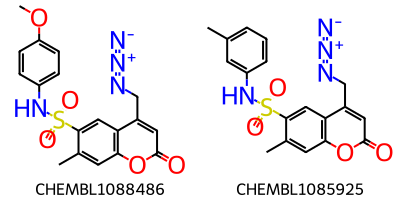

------------------------------
Compuesto A: CHEMBL1085167 (pMIC: -0.3573)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1548
Similitud estructural (Tanimoto): 0.5974
Valor de SALI: 5.3522


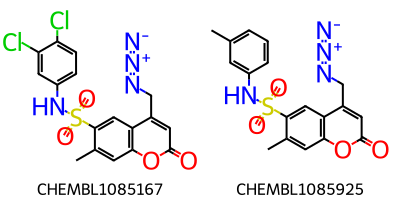

------------------------------
Compuesto A: CHEMBL1087161 (pMIC: -0.3763)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1358
Similitud estructural (Tanimoto): 0.557
Valor de SALI: 4.8212


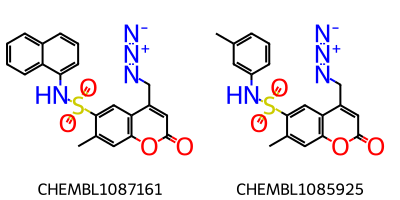

------------------------------
Compuesto A: CHEMBL1087792 (pMIC: -0.3671)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.145
Similitud estructural (Tanimoto): 0.5556
Valor de SALI: 4.8267


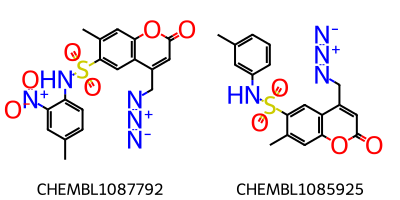

------------------------------
Compuesto A: CHEMBL1082537 (pMIC: -0.3469)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1652
Similitud estructural (Tanimoto): 0.5
Valor de SALI: 4.3304


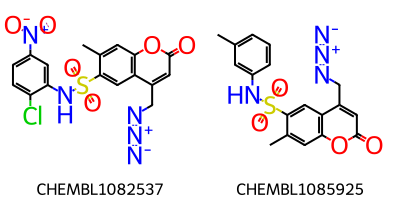

------------------------------
Compuesto A: CHEMBL1084925 (pMIC: -0.3469)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1652
Similitud estructural (Tanimoto): 0.5176
Valor de SALI: 4.4884


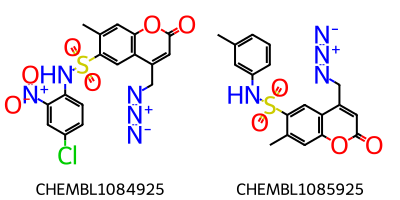

------------------------------
Compuesto A: CHEMBL1088206 (pMIC: -0.3996)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1125
Similitud estructural (Tanimoto): 0.6
Valor de SALI: 5.2812


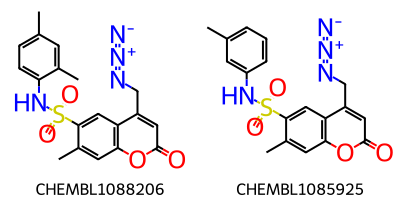

------------------------------
Compuesto A: CHEMBL5394219 (pMIC: -0.6243)
Compuesto B: CHEMBL5395033 (pMIC: -2.749)
Diferencia de actividad: 2.1247
Similitud estructural (Tanimoto): 0.5968
Valor de SALI: 5.2696


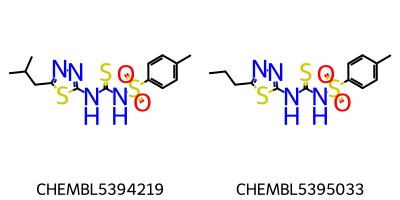

------------------------------
Compuesto A: CHEMBL5394219 (pMIC: -0.6243)
Compuesto B: CHEMBL5401312 (pMIC: -3.0332)
Diferencia de actividad: 2.4089
Similitud estructural (Tanimoto): 0.5781
Valor de SALI: 5.7096


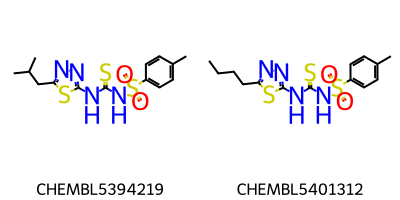

------------------------------
Compuesto A: CHEMBL5422204 (pMIC: -0.6082)
Compuesto B: CHEMBL5395033 (pMIC: -2.749)
Diferencia de actividad: 2.1408
Similitud estructural (Tanimoto): 0.6721
Valor de SALI: 6.5288


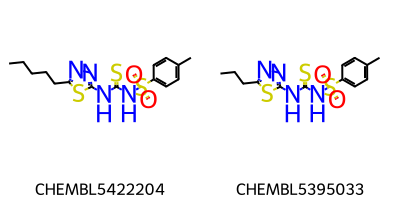

------------------------------
Compuesto A: CHEMBL5422204 (pMIC: -0.6082)
Compuesto B: CHEMBL5401312 (pMIC: -3.0332)
Diferencia de actividad: 2.4251
Similitud estructural (Tanimoto): 0.7333
Valor de SALI: 9.093


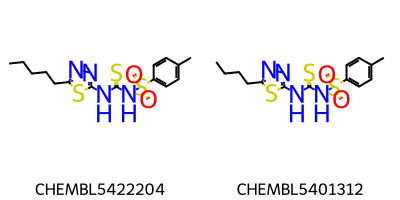

------------------------------
Compuesto A: CHEMBL454083 (pMIC: -1.5364)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5751
Similitud estructural (Tanimoto): 0.2826
Valor de SALI: 3.5895


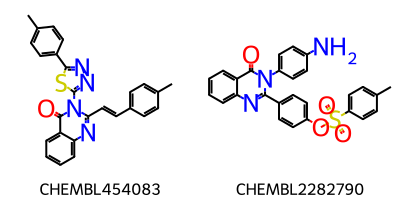

------------------------------
Compuesto A: CHEMBL454340 (pMIC: -1.5388)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5727
Similitud estructural (Tanimoto): 0.268
Valor de SALI: 3.5146


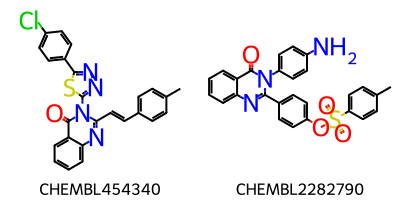

------------------------------
Compuesto A: CHEMBL511010 (pMIC: -1.5446)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5668
Similitud estructural (Tanimoto): 0.2947
Valor de SALI: 3.6393


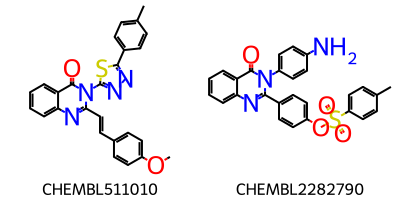

------------------------------
Compuesto A: CHEMBL451741 (pMIC: -1.5328)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5786
Similitud estructural (Tanimoto): 0.2632
Valor de SALI: 3.4997


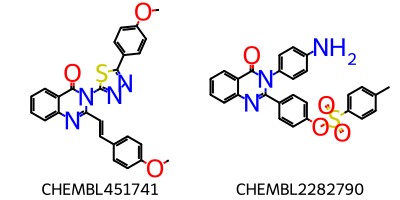

------------------------------
Compuesto A: CHEMBL485838 (pMIC: -1.5342)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5773
Similitud estructural (Tanimoto): 0.25
Valor de SALI: 3.4364


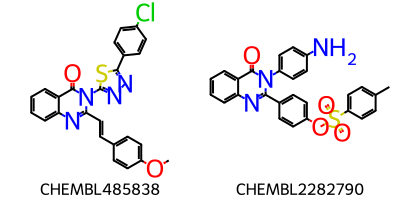

------------------------------
Compuesto A: CHEMBL508966 (pMIC: -1.5608)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5507
Similitud estructural (Tanimoto): 0.2574
Valor de SALI: 3.4348


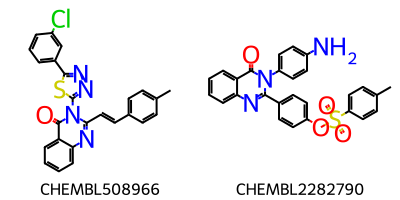

------------------------------
Compuesto A: CHEMBL453308 (pMIC: -1.5948)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5166
Similitud estructural (Tanimoto): 0.2826
Valor de SALI: 3.5079


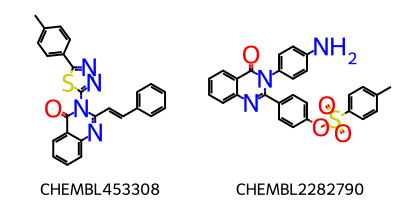

------------------------------
Compuesto A: CHEMBL520033 (pMIC: -1.5961)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5153
Similitud estructural (Tanimoto): 0.2796
Valor de SALI: 3.4915


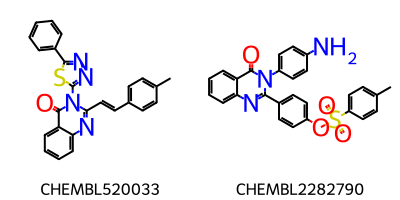

------------------------------
Compuesto A: CHEMBL486038 (pMIC: -1.5691)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5423
Similitud estructural (Tanimoto): 0.2947
Valor de SALI: 3.6046


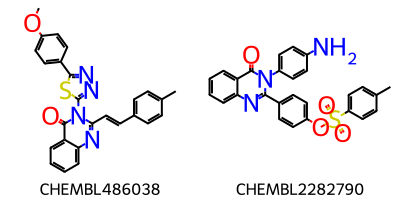

------------------------------
Compuesto A: CHEMBL486034 (pMIC: -1.5824)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.529
Similitud estructural (Tanimoto): 0.2526
Valor de SALI: 3.3837


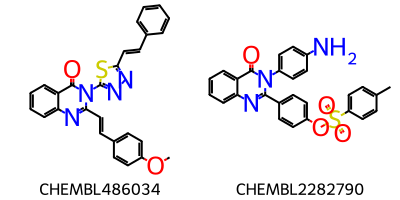

------------------------------
Compuesto A: CHEMBL455639 (pMIC: -1.6138)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.4977
Similitud estructural (Tanimoto): 0.25
Valor de SALI: 3.3303


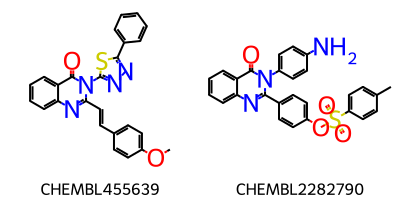

------------------------------
Compuesto A: CHEMBL454597 (pMIC: -1.6265)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.485
Similitud estructural (Tanimoto): 0.2609
Valor de SALI: 3.3622


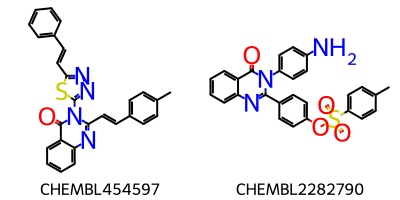

------------------------------
Compuesto A: CHEMBL452781 (pMIC: -1.6757)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.4358
Similitud estructural (Tanimoto): 0.2632
Valor de SALI: 3.3059


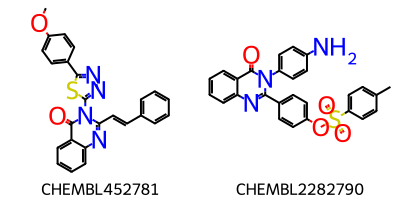

------------------------------


In [ ]:
# prompt: Muestra las imagenes con los pares de molecualas que son Cliffs usando RDKit, obtenidas del siguiente codigo: #Umbrales Relativos considerando promedio + 2 veces la desviación estandar

cliffs = merge[(merge['Similitud estructural (Tanimoto)'] > thresholds_Similarity) & (merge['Diferencia de actividad'] > thresholds_ActivityDiff_rel)]

print(f"Número de pares considerados Activity Cliffs: {len(cliffs)}")

for index, row in cliffs.iterrows():
    mol_a = Chem.MolFromSmiles(row['Smiles A'])
    mol_b = Chem.MolFromSmiles(row['Smiles B'])

    if mol_a and mol_b:
        print(f"Compuesto A: {row['Compuesto A']} (pMIC: {row['pMIC_uM A']})")
        print(f"Compuesto B: {row['Compuesto B']} (pMIC: {row['pMIC_uM B']})")
        print(f"Diferencia de actividad: {row['Diferencia de actividad']}")
        print(f"Similitud estructural (Tanimoto): {row['Similitud estructural (Tanimoto)']}")
        print(f"Valor de SALI: {row['Valor de SALI']}")

        img = Draw.MolsToGridImage([mol_a, mol_b], legends=[row['Compuesto A'], row['Compuesto B']], molsPerRow=2)
        display(img)
        print("-" * 30)
    else:
        print(f"Could not process SMILES for pair: {row['Compuesto A']} and {row['Compuesto B']}")
        print("-" * 30)


In [ ]:
# merge = pd.read_csv('https://raw.githubusercontent.com/LGLV-Ciencia-de-Datos/Paclobutrazol_like-ML/refs/heads/main/Fusarium_Oxysporum(1).csv')
merge = pd.read_csv('/content/FO_activity_similarity_data_plot(1).csv')

merge

,Compuesto A,pMIC A,Smiles A,Compuesto B,pMIC B,Smiles B,Diferencia de actividad,Similitud estructural (Tanimoto),Valor de SALI
0,CHEMBL234895,1.6538,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL1362013,0.1161,Oc1cc(-c2ccccc2)nc2nc3ccccc3n12,1.5377,0.0455,1.6110
1,CHEMBL234895,1.6538,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL2435159,0.2165,O=c1cc(-c2ccc(C(F)(F)F)cc2)nc2[nH]c3ccccc3n12,1.4372,0.0676,1.5414
2,CHEMBL234895,1.6538,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL2435155,0.1024,O=c1cc(C(F)(F)F)nc2[nH]c3ccccc3n12,1.5514,0.0794,1.6852
3,CHEMBL234895,1.6538,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL2435147,0.3047,CC(C)c1cc(=O)n2c3ccccc3n(Cc3cc(=O)oc4ccc(F)cc3...,1.3490,0.0659,1.4442
4,CHEMBL234895,1.6538,C#CS(=O)(=O)c1ccc(C)cc1,CHEMBL2435146,0.3175,COc1ccc2oc(=O)cc(Cn3c4ccccc4n4c(=O)cc(C(C)C)nc...,1.3363,0.0645,1.4284
...,...,...,...,...,...,...,...,...,...
205756,CHEMBL2262377,-3.3402,Cc1ccc2nc(Cl)c(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)...,CHEMBL2262373,-3.3537,Cc1ccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)N...,0.0135,0.5056,0.0273
205757,CHEMBL2262377,-3.3402,Cc1ccc2nc(Cl)c(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)...,CHEMBL2282790,-4.1114,Cc1ccc(S(=O)(=O)Oc2ccc(-c3nc4ccccc4c(=O)n3-c3c...,0.7713,0.1327,0.8893
205758,CHEMBL2262374,-3.3537,Cc1cccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)...,CHEMBL2262373,-3.3537,Cc1ccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)N...,0.0000,0.5402,0.0000
205759,CHEMBL2262374,-3.3537,Cc1cccc2cc(/C=N/NC(=O)C3=C(O)c4ccccc4S(=O)(=O)...,CHEMBL2282790,-4.1114,Cc1ccc(S(=O)(=O)Oc2ccc(-c3nc4ccccc4c(=O)n3-c3c...,0.7577,0.1034,0.8451


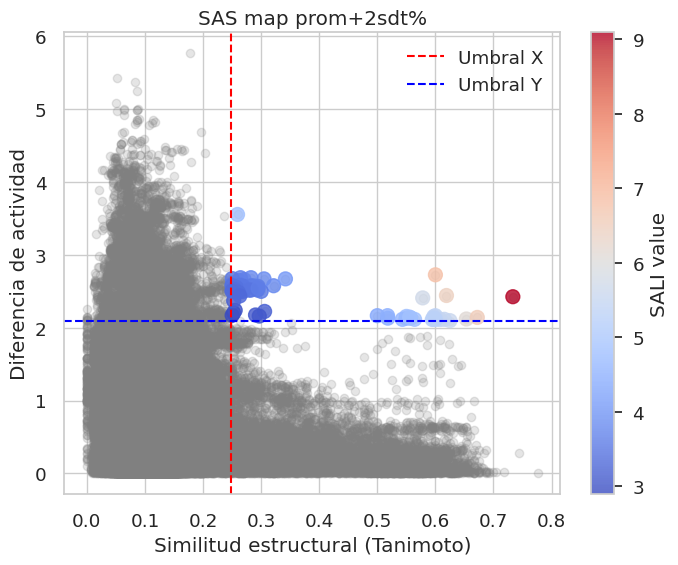

In [ ]:
#Umbrales Relativos considerando promedio + 2 veces la desviación estandar
thresholds_ActivityDiff_rel= merge['Diferencia de actividad'].mean() + 2 * merge['Diferencia de actividad'].std()
thresholds_Similarity = merge['Similitud estructural (Tanimoto)'].mean() + 2 * merge['Similitud estructural (Tanimoto)'].std()
# Ejemplo de uso con umbrales
SAS_map(merge, similarity_column='Similitud estructural (Tanimoto)', dif_activity_col='Diferencia de actividad',
        sali_col='Valor de SALI', umbral_x=thresholds_Similarity, umbral_y=thresholds_ActivityDiff_rel, set_title='SAS map prom+2sdt%')

In [ ]:
# prompt: mustre cuanto cumpuetos estan por encima del treshold

cliffs = merge[(merge['Similitud estructural (Tanimoto)'] > thresholds_Similarity) & (merge['Diferencia de actividad'] > thresholds_ActivityDiff_rel)]

print(f"El número de compuestos por encima del umbral de Activity Cliffs es: {len(cliffs)}")


El número de compuestos por encima del umbral de Activity Cliffs es: 64


Número de pares considerados Activity Cliffs: 64
Compuesto A: CHEMBL234895 (pMIC: 1.6538)
Compuesto B: CHEMBL5419490 (pMIC: -1.9004)
Diferencia de actividad: 3.5542
Similitud estructural (Tanimoto): 0.2593
Valor de SALI: 4.7984


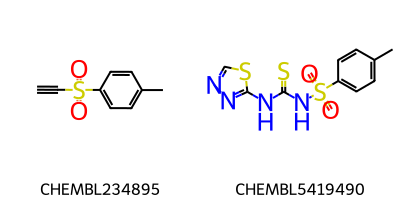

------------------------------
Compuesto A: CHEMBL2435147 (pMIC: 0.3047)
Compuesto B: CHEMBL2234662 (pMIC: -2.3425)
Diferencia de actividad: 2.6472
Similitud estructural (Tanimoto): 0.2619
Valor de SALI: 3.5865


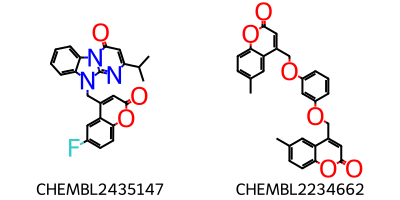

------------------------------
Compuesto A: CHEMBL2435146 (pMIC: 0.3175)
Compuesto B: CHEMBL2234655 (pMIC: -2.2483)
Diferencia de actividad: 2.5658
Similitud estructural (Tanimoto): 0.2556
Valor de SALI: 3.4468


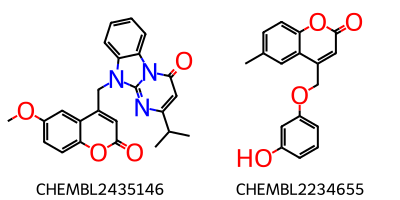

------------------------------
Compuesto A: CHEMBL2435146 (pMIC: 0.3175)
Compuesto B: CHEMBL2234662 (pMIC: -2.3425)
Diferencia de actividad: 2.66
Similitud estructural (Tanimoto): 0.2706
Valor de SALI: 3.6468


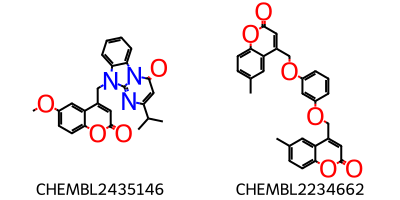

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234655 (pMIC: -2.2483)
Diferencia de actividad: 2.576
Similitud estructural (Tanimoto): 0.3214
Valor de SALI: 3.7961


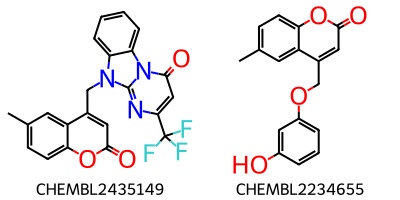

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234670 (pMIC: -2.1893)
Diferencia de actividad: 2.517
Similitud estructural (Tanimoto): 0.2632
Valor de SALI: 3.4161


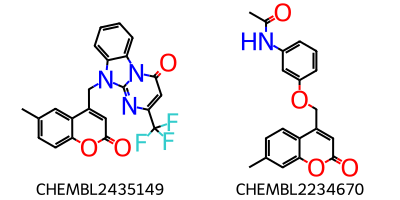

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234669 (pMIC: -2.1893)
Diferencia de actividad: 2.517
Similitud estructural (Tanimoto): 0.2935
Valor de SALI: 3.5626


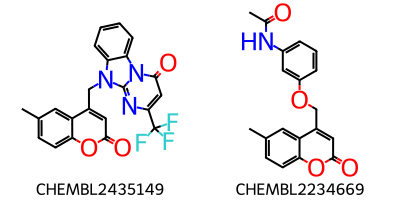

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234656 (pMIC: -2.2483)
Diferencia de actividad: 2.576
Similitud estructural (Tanimoto): 0.2874
Valor de SALI: 3.6149


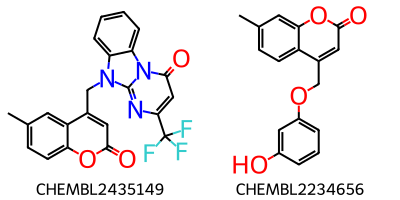

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234677 (pMIC: -2.1708)
Diferencia de actividad: 2.4985
Similitud estructural (Tanimoto): 0.2688
Valor de SALI: 3.417


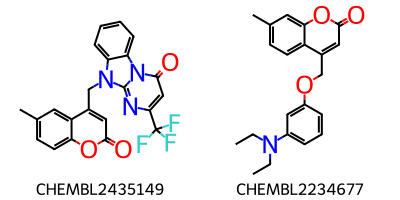

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234676 (pMIC: -2.1708)
Diferencia de actividad: 2.4985
Similitud estructural (Tanimoto): 0.3
Valor de SALI: 3.5693


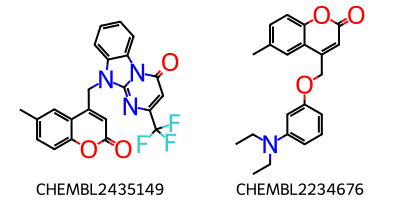

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234662 (pMIC: -2.3425)
Diferencia de actividad: 2.6702
Similitud estructural (Tanimoto): 0.3418
Valor de SALI: 4.0568


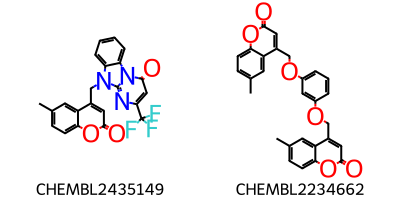

------------------------------
Compuesto A: CHEMBL2435149 (pMIC: 0.3277)
Compuesto B: CHEMBL2234663 (pMIC: -2.3425)
Diferencia de actividad: 2.6702
Similitud estructural (Tanimoto): 0.3049
Valor de SALI: 3.8415


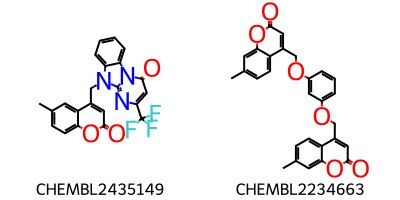

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234661 (pMIC: -1.8574)
Diferencia de actividad: 2.2012
Similitud estructural (Tanimoto): 0.2527
Valor de SALI: 2.9455


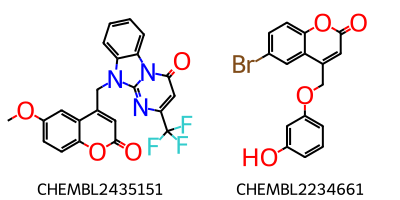

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234678 (pMIC: -1.8257)
Diferencia de actividad: 2.1695
Similitud estructural (Tanimoto): 0.25
Valor de SALI: 2.8927


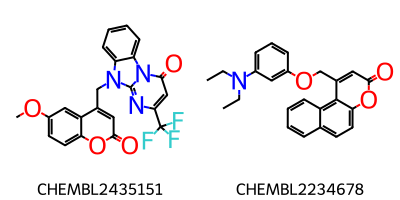

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234657 (pMIC: -1.8951)
Diferencia de actividad: 2.2388
Similitud estructural (Tanimoto): 0.2553
Valor de SALI: 3.0063


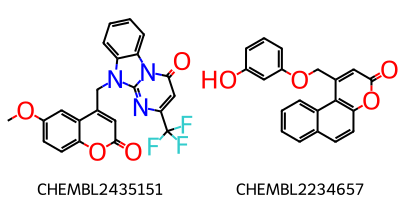

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2429909 (pMIC: -2.0264)
Diferencia de actividad: 2.3702
Similitud estructural (Tanimoto): 0.2527
Valor de SALI: 3.1717


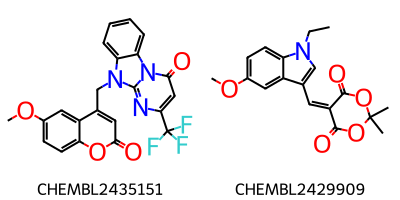

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234655 (pMIC: -2.2483)
Diferencia de actividad: 2.592
Similitud estructural (Tanimoto): 0.2667
Valor de SALI: 3.5347


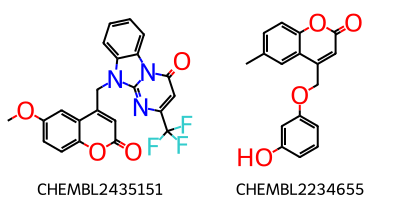

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234656 (pMIC: -2.2483)
Diferencia de actividad: 2.592
Similitud estructural (Tanimoto): 0.25
Valor de SALI: 3.456


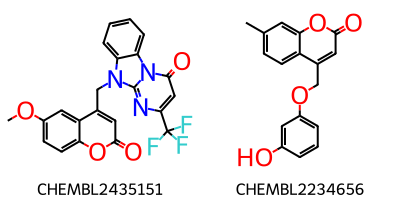

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234676 (pMIC: -2.1708)
Diferencia de actividad: 2.5146
Similitud estructural (Tanimoto): 0.25
Valor de SALI: 3.3528


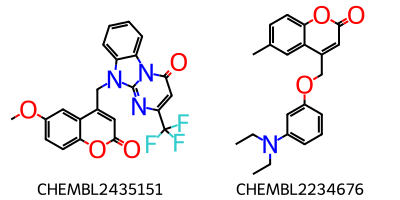

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234662 (pMIC: -2.3425)
Diferencia de actividad: 2.6863
Similitud estructural (Tanimoto): 0.2824
Valor de SALI: 3.7435


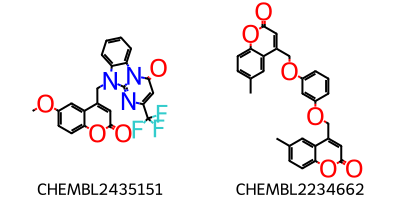

------------------------------
Compuesto A: CHEMBL2435151 (pMIC: 0.3438)
Compuesto B: CHEMBL2234663 (pMIC: -2.3425)
Diferencia de actividad: 2.6863
Similitud estructural (Tanimoto): 0.2644
Valor de SALI: 3.6518


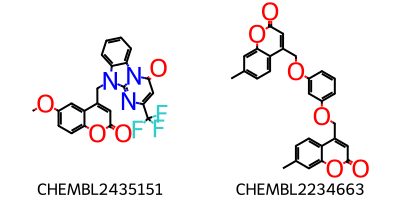

------------------------------
Compuesto A: CHEMBL2435150 (pMIC: 0.3318)
Compuesto B: CHEMBL2234662 (pMIC: -2.3425)
Diferencia de actividad: 2.6742
Similitud estructural (Tanimoto): 0.25
Valor de SALI: 3.5656


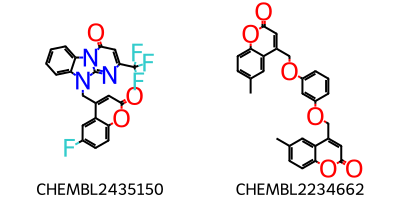

------------------------------
Compuesto A: CHEMBL2435144 (pMIC: 0.3658)
Compuesto B: CHEMBL2234675 (pMIC: -1.8089)
Diferencia de actividad: 2.1747
Similitud estructural (Tanimoto): 0.2903
Valor de SALI: 3.0643


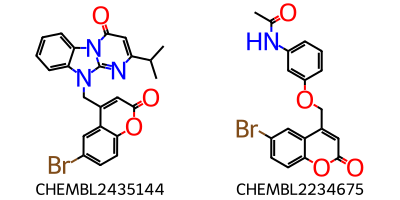

------------------------------
Compuesto A: CHEMBL2435144 (pMIC: 0.3658)
Compuesto B: CHEMBL2234661 (pMIC: -1.8574)
Diferencia de actividad: 2.2232
Similitud estructural (Tanimoto): 0.3059
Valor de SALI: 3.203


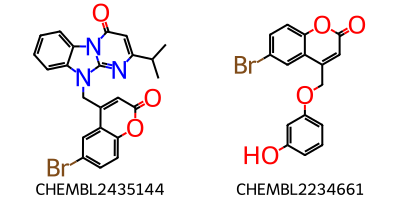

------------------------------
Compuesto A: CHEMBL2435144 (pMIC: 0.3658)
Compuesto B: CHEMBL2234682 (pMIC: -1.7934)
Diferencia de actividad: 2.1592
Similitud estructural (Tanimoto): 0.2967
Valor de SALI: 3.0701


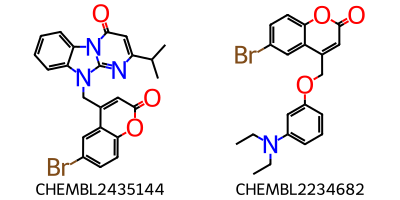

------------------------------
Compuesto A: CHEMBL5427814 (pMIC: -0.3071)
Compuesto B: CHEMBL5395033 (pMIC: -2.749)
Diferencia de actividad: 2.4418
Similitud estructural (Tanimoto): 0.619
Valor de SALI: 6.4089


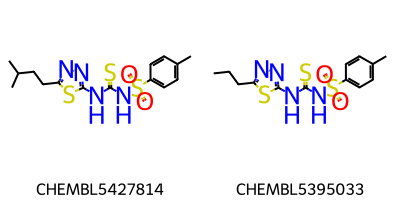

------------------------------
Compuesto A: CHEMBL5427814 (pMIC: -0.3071)
Compuesto B: CHEMBL5401312 (pMIC: -3.0332)
Diferencia de actividad: 2.7261
Similitud estructural (Tanimoto): 0.6
Valor de SALI: 6.8152


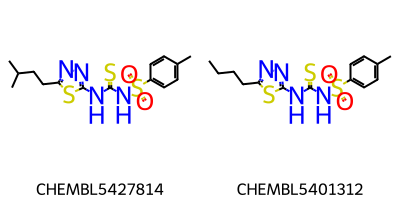

------------------------------
Compuesto A: CHEMBL1085158 (pMIC: -0.3815)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1306
Similitud estructural (Tanimoto): 0.557
Valor de SALI: 4.8095


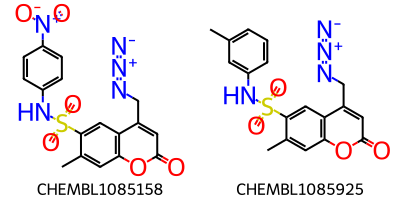

------------------------------
Compuesto A: CHEMBL1077071 (pMIC: -0.3573)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1548
Similitud estructural (Tanimoto): 0.55
Valor de SALI: 4.7884


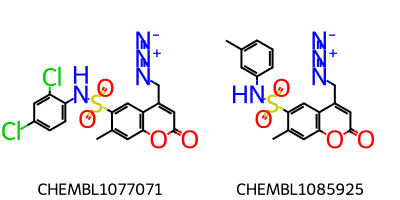

------------------------------
Compuesto A: CHEMBL1088487 (pMIC: -0.3825)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1296
Similitud estructural (Tanimoto): 0.55
Valor de SALI: 4.7324


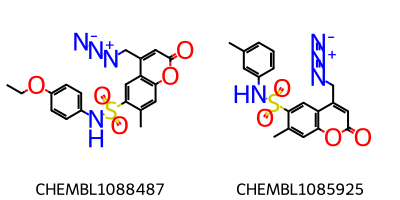

------------------------------
Compuesto A: CHEMBL1077037 (pMIC: -0.3815)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1306
Similitud estructural (Tanimoto): 0.5181
Valor de SALI: 4.4212


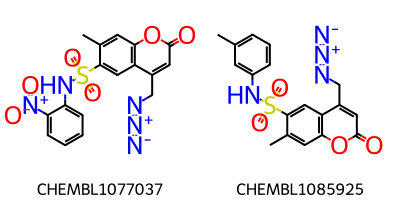

------------------------------
Compuesto A: CHEMBL1082231 (pMIC: -0.3475)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1646
Similitud estructural (Tanimoto): 0.6
Valor de SALI: 5.4115


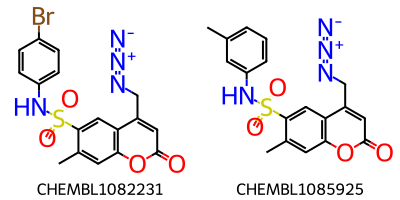

------------------------------
Compuesto A: CHEMBL1082232 (pMIC: -0.3779)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1342
Similitud estructural (Tanimoto): 0.5974
Valor de SALI: 5.301


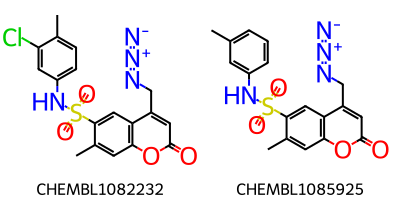

------------------------------
Compuesto A: CHEMBL1087560 (pMIC: -0.3975)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1146
Similitud estructural (Tanimoto): 0.5432
Valor de SALI: 4.6292


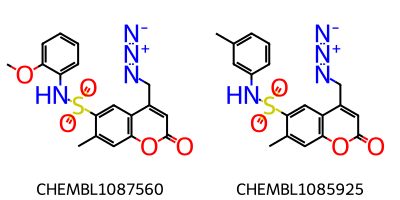

------------------------------
Compuesto A: CHEMBL1087559 (pMIC: -0.3996)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1125
Similitud estructural (Tanimoto): 0.5946
Valor de SALI: 5.2109


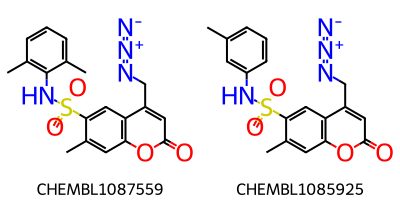

------------------------------
Compuesto A: CHEMBL1085926 (pMIC: -0.4152)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.0969
Similitud estructural (Tanimoto): 0.625
Valor de SALI: 5.5917


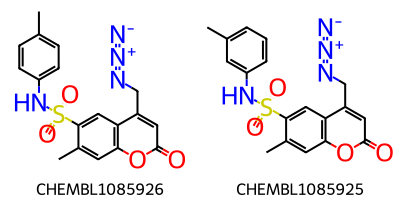

------------------------------
Compuesto A: CHEMBL1088205 (pMIC: -0.3996)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1125
Similitud estructural (Tanimoto): 0.6081
Valor de SALI: 5.3904


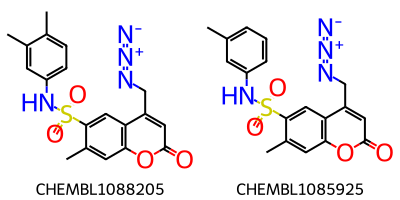

------------------------------
Compuesto A: CHEMBL1085166 (pMIC: -0.3927)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1194
Similitud estructural (Tanimoto): 0.6
Valor de SALI: 5.2985


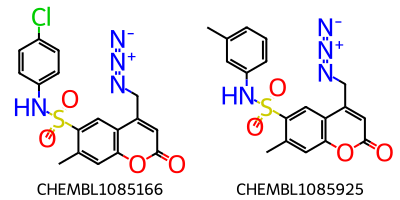

------------------------------
Compuesto A: CHEMBL1084917 (pMIC: -0.3927)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1194
Similitud estructural (Tanimoto): 0.6533
Valor de SALI: 6.1131


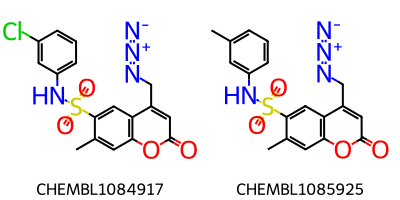

------------------------------
Compuesto A: CHEMBL1087561 (pMIC: -0.3975)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1146
Similitud estructural (Tanimoto): 0.6154
Valor de SALI: 5.4982


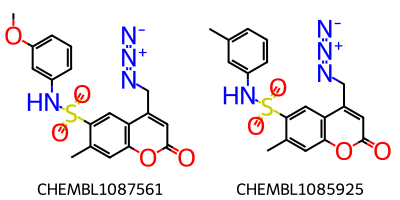

------------------------------
Compuesto A: CHEMBL1088486 (pMIC: -0.3975)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1146
Similitud estructural (Tanimoto): 0.5641
Valor de SALI: 4.8511


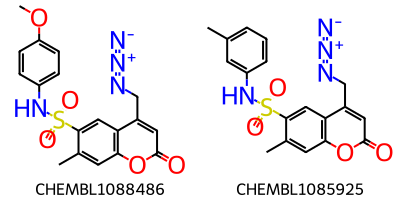

------------------------------
Compuesto A: CHEMBL1085167 (pMIC: -0.3573)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1548
Similitud estructural (Tanimoto): 0.5974
Valor de SALI: 5.3522


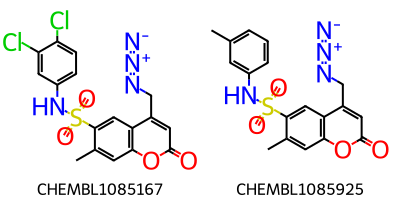

------------------------------
Compuesto A: CHEMBL1087161 (pMIC: -0.3763)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1358
Similitud estructural (Tanimoto): 0.557
Valor de SALI: 4.8212


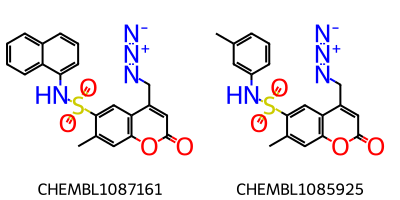

------------------------------
Compuesto A: CHEMBL1087792 (pMIC: -0.3671)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.145
Similitud estructural (Tanimoto): 0.5556
Valor de SALI: 4.8267


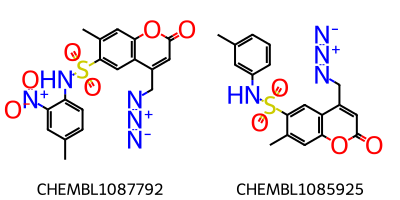

------------------------------
Compuesto A: CHEMBL1082537 (pMIC: -0.3469)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1652
Similitud estructural (Tanimoto): 0.5
Valor de SALI: 4.3304


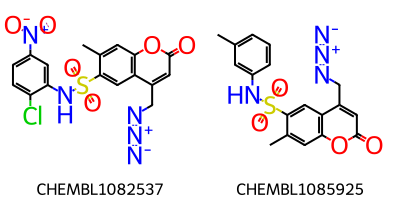

------------------------------
Compuesto A: CHEMBL1084925 (pMIC: -0.3469)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1652
Similitud estructural (Tanimoto): 0.5176
Valor de SALI: 4.4884


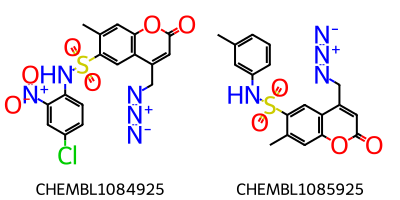

------------------------------
Compuesto A: CHEMBL1088206 (pMIC: -0.3996)
Compuesto B: CHEMBL1085925 (pMIC: -2.5121)
Diferencia de actividad: 2.1125
Similitud estructural (Tanimoto): 0.6
Valor de SALI: 5.2812


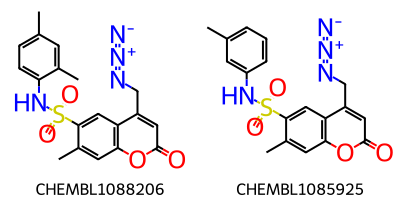

------------------------------
Compuesto A: CHEMBL5394219 (pMIC: -0.6243)
Compuesto B: CHEMBL5395033 (pMIC: -2.749)
Diferencia de actividad: 2.1247
Similitud estructural (Tanimoto): 0.5968
Valor de SALI: 5.2696


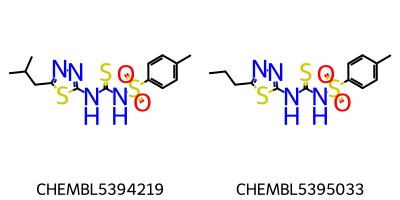

------------------------------
Compuesto A: CHEMBL5394219 (pMIC: -0.6243)
Compuesto B: CHEMBL5401312 (pMIC: -3.0332)
Diferencia de actividad: 2.4089
Similitud estructural (Tanimoto): 0.5781
Valor de SALI: 5.7096


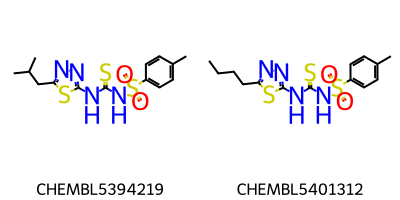

------------------------------
Compuesto A: CHEMBL5422204 (pMIC: -0.6082)
Compuesto B: CHEMBL5395033 (pMIC: -2.749)
Diferencia de actividad: 2.1408
Similitud estructural (Tanimoto): 0.6721
Valor de SALI: 6.5288


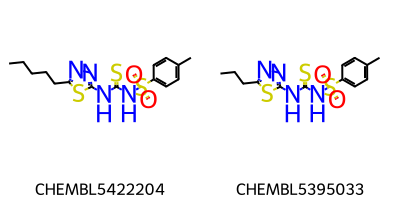

------------------------------
Compuesto A: CHEMBL5422204 (pMIC: -0.6082)
Compuesto B: CHEMBL5401312 (pMIC: -3.0332)
Diferencia de actividad: 2.4251
Similitud estructural (Tanimoto): 0.7333
Valor de SALI: 9.093


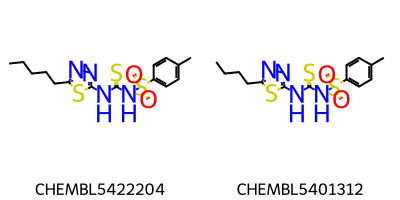

------------------------------
Compuesto A: CHEMBL454083 (pMIC: -1.5364)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5751
Similitud estructural (Tanimoto): 0.2826
Valor de SALI: 3.5895


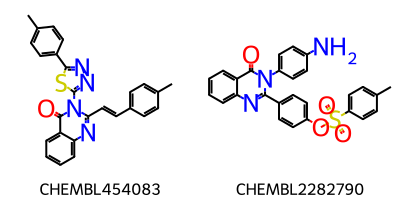

------------------------------
Compuesto A: CHEMBL454340 (pMIC: -1.5388)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5727
Similitud estructural (Tanimoto): 0.268
Valor de SALI: 3.5146


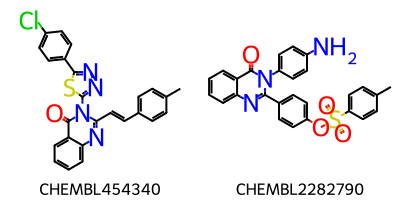

------------------------------
Compuesto A: CHEMBL511010 (pMIC: -1.5446)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5668
Similitud estructural (Tanimoto): 0.2947
Valor de SALI: 3.6393


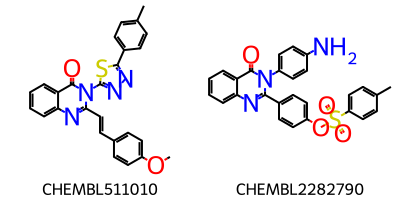

------------------------------
Compuesto A: CHEMBL451741 (pMIC: -1.5328)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5786
Similitud estructural (Tanimoto): 0.2632
Valor de SALI: 3.4997


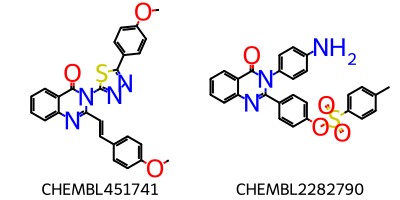

------------------------------
Compuesto A: CHEMBL485838 (pMIC: -1.5342)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5773
Similitud estructural (Tanimoto): 0.25
Valor de SALI: 3.4364


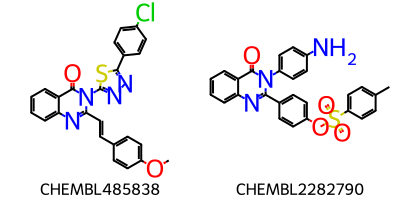

------------------------------
Compuesto A: CHEMBL508966 (pMIC: -1.5608)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5507
Similitud estructural (Tanimoto): 0.2574
Valor de SALI: 3.4348


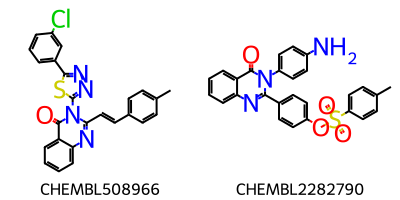

------------------------------
Compuesto A: CHEMBL453308 (pMIC: -1.5948)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5166
Similitud estructural (Tanimoto): 0.2826
Valor de SALI: 3.5079


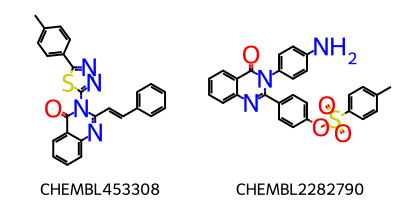

------------------------------
Compuesto A: CHEMBL520033 (pMIC: -1.5961)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5153
Similitud estructural (Tanimoto): 0.2796
Valor de SALI: 3.4915


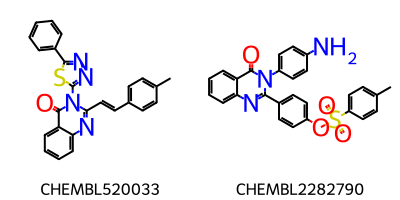

------------------------------
Compuesto A: CHEMBL486038 (pMIC: -1.5691)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.5423
Similitud estructural (Tanimoto): 0.2947
Valor de SALI: 3.6046


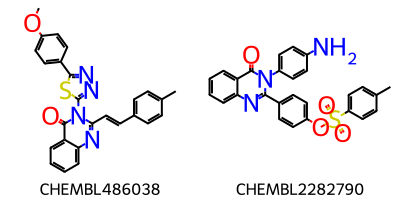

------------------------------
Compuesto A: CHEMBL486034 (pMIC: -1.5824)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.529
Similitud estructural (Tanimoto): 0.2526
Valor de SALI: 3.3837


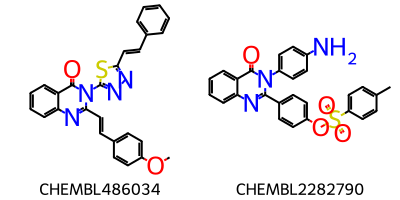

------------------------------
Compuesto A: CHEMBL455639 (pMIC: -1.6138)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.4977
Similitud estructural (Tanimoto): 0.25
Valor de SALI: 3.3303


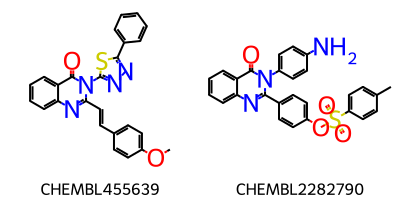

------------------------------
Compuesto A: CHEMBL454597 (pMIC: -1.6265)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.485
Similitud estructural (Tanimoto): 0.2609
Valor de SALI: 3.3622


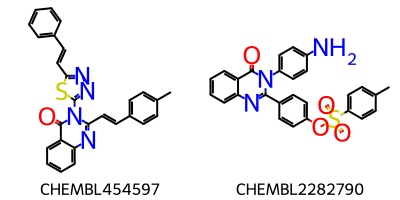

------------------------------
Compuesto A: CHEMBL452781 (pMIC: -1.6757)
Compuesto B: CHEMBL2282790 (pMIC: -4.1114)
Diferencia de actividad: 2.4358
Similitud estructural (Tanimoto): 0.2632
Valor de SALI: 3.3059


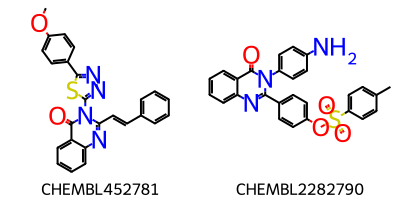

------------------------------


In [ ]:
# Muestra las imagenes con los pares de molecualas que son Cliffs usando RDKit, obtenidas del siguiente codigo: #Umbrales Relativos considerando promedio + 2 veces la desviación estandar

cliffs = merge[(merge['Similitud estructural (Tanimoto)'] > thresholds_Similarity) & (merge['Diferencia de actividad'] > thresholds_ActivityDiff_rel)]

print(f"Número de pares considerados Activity Cliffs: {len(cliffs)}")

for index, row in cliffs.iterrows():
    mol_a = Chem.MolFromSmiles(row['Smiles A'])
    mol_b = Chem.MolFromSmiles(row['Smiles B'])

    if mol_a and mol_b:
        print(f"Compuesto A: {row['Compuesto A']} (pMIC: {row['pMIC A']})")
        print(f"Compuesto B: {row['Compuesto B']} (pMIC: {row['pMIC B']})")
        print(f"Diferencia de actividad: {row['Diferencia de actividad']}")
        print(f"Similitud estructural (Tanimoto): {row['Similitud estructural (Tanimoto)']}")
        print(f"Valor de SALI: {row['Valor de SALI']}")

        img = Draw.MolsToGridImage([mol_a, mol_b], legends=[row['Compuesto A'], row['Compuesto B']], molsPerRow=2)
        display(img)
        print("-" * 30)
    else:
        print(f"Could not process SMILES for pair: {row['Compuesto A']} and {row['Compuesto B']}")
        print("-" * 30)



In [ ]:
# prompt: en activity cliffts haya 64 pares y deseio quitar un elemento de cada para pero de la df original llamada db_treatment, lo cual significa que deberia tener un df filtradad de al menos 578 compuestos o 514 compuestos

import pandas as pd
# Filtrar el DataFrame 'cliffs' para obtener los ID de los compuestos involucrados
cliff_compound_ids = pd.concat([cliffs['Compuesto A'], cliffs['Compuesto B']]).unique()

# Convertir los IDs a un conjunto para una búsqueda más eficiente
cliff_compound_ids_set = set(cliff_compound_ids)

# Filtrar el DataFrame original 'db_treatment' para excluir los compuestos que forman pares en 'cliffs'
# Consideramos que cada compuesto en un par cliff debe ser eliminado.
db_treatment_filtered = db_treatment[~db_treatment['molecule_chembl_id'].isin(cliff_compound_ids_set)].copy()

print(f"Número de compuestos en el DataFrame original: {len(db_treatment)}")
print(f"Número de compuestos considerados Activity Cliffs (en pares): {len(cliff_compound_ids_set)}")
print(f"Número de compuestos en el DataFrame filtrado (sin compuestos cliff): {len(db_treatment_filtered)}")

# Opcionalmente, puedes imprimir el DataFrame filtrado
# print(db_treatment_filtered)


Número de compuestos en el DataFrame original: 642
Número de compuestos considerados Activity Cliffs (en pares): 62
Número de compuestos en el DataFrame filtrado (sin compuestos cliff): 580


<ipython-input-7-1318510482>:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


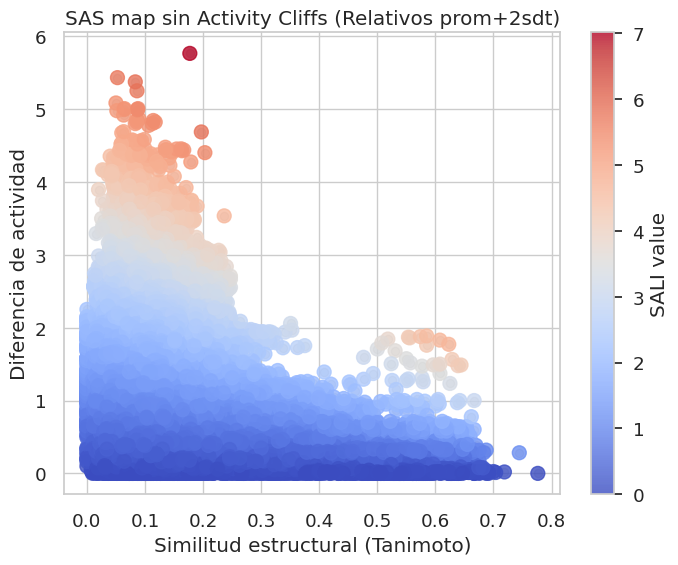

In [ ]:
# prompt: ahora adapta elsiguiente codigo para ver la grafica sin los cliffts: #Umbrales Relativos considerando promedio + 2 veces la desviación estandar
# thresholds_ActivityDiff_rel= merge['Diferencia de actividad'].mean() + 2 * merge['Diferencia de actividad'].std()
# thresholds_Similarity = merge['Similitud estructural (Tanimoto)'].mean() + 2 * merge['Similitud estructural (Tanimoto)'].std()
# # Ejemplo de uso con umbrales
# SAS_map(merge, similarity_column='Similitud estructural (Tanimoto)', dif_activity_col='Diferencia de actividad',
#         sali_col='Valor de SALI', umbral_x=thresholds_Similarity, umbral_y=thresholds_ActivityDiff_rel, set_title='SAS map prom+2sdt%')

# Umbrales Relativos considerando promedio + 2 veces la desviación estandar
thresholds_ActivityDiff_rel = merge['Diferencia de actividad'].mean() + 2 * merge['Diferencia de actividad'].std()
thresholds_Similarity = merge['Similitud estructural (Tanimoto)'].mean() + 2 * merge['Similitud estructural (Tanimoto)'].std()

# Filtramos los datos para excluir los "cliffs"
# Los "cliffs" son los puntos donde la similitud estructural es baja Y la diferencia de actividad es alta.
# Queremos eliminar los puntos con alta diferencia de actividad Y baja similitud.
# Por lo tanto, los puntos *no* considerados cliffs tendrán BAJA diferencia de actividad O ALTA similitud.
# Sin embargo, el objetivo es mostrar la gráfica *sin* los puntos identificados como cliffs,
# que en este caso son los puntos en el "cuarto cuadrante" de la gráfica SAS map,
# definidos por tener Similitud > umbral_x y Diferencia de actividad > umbral_y.
# Para mostrar la gráfica sin estos puntos, simplemente graficamos todos los puntos EXCEPTO los que cumplen esta condición.

# Identificar los puntos que son considerados "cliffs"
cliffs_to_exclude = merge[(merge['Similitud estructural (Tanimoto)'] > thresholds_Similarity) & (merge['Diferencia de actividad'] > thresholds_ActivityDiff_rel)]

# Crear un nuevo DataFrame excluyendo los "cliffs"
merge_filtered = merge.drop(cliffs_to_exclude.index).copy()


# Ahora, grafica el SAS map usando el DataFrame filtrado
SAS_map(merge_filtered, similarity_column='Similitud estructural (Tanimoto)', dif_activity_col='Diferencia de actividad',
        sali_col='Valor de SALI', umbral_x=None, umbral_y=None, set_title='SAS map sin Activity Cliffs (Relativos prom+2sdt)')

# NOTA: La función SAS_map original está diseñada para resaltar los puntos CADA VEZ que se llama con umbrales.
# Si solo quieres ver el mapa sin los cliffs, no necesitas pasarle umbrales en esta llamada,
# ya que los puntos cliff ya fueron eliminados del dataframe 'merge_filtered'.
# Si quisieras graficar con umbrales en el dataframe filtrado, los umbrales seguirían siendo los mismos,
# pero la interpretación sería que estás viendo los umbrales aplicados a un conjunto de datos que ya no incluye los cliffs.
# La instrucción "sin los cliffts" implica simplemente no mostrar esos puntos.
# La función SAS_map ya maneja la coloración por valor SALI sin necesidad de umbrales.


In [ ]:
db_treatment_filtered

,Unnamed: 0,molecule_chembl_id,canonical_smiles,standard_value,standard_units,target_chembl_id,target_organism,MW,LogP,HBA,...,logP,TPSA,CSP3,NumRings,HetAtoms,RotBonds,Molecule,QED,SA,Dataset
0,2,CHEMBL393258,COc1cc(O)cc2c1C(=O)O[C@@H](C)CCCCCCC2,100.00,ug.mL-1,CHEMBL612648,Fusarium oxysporum,292.167459,3.84280,4,...,3.84280,55.76,0.588235,2,4,1,<rdkit.Chem.rdchem.Mol object at 0x7a2419f2f4c0>,0.798916,3.168201,Fusarium oxysporum
1,3,CHEMBL211893,CC1CCCCCCCc2cc(O)cc(O)c2C(=O)O1,50.00,ug.mL-1,CHEMBL612648,Fusarium oxysporum,278.151809,3.53980,4,...,3.53980,66.76,0.562500,2,4,0,<rdkit.Chem.rdchem.Mol object at 0x7a2419f2f140>,0.712264,3.199496,Fusarium oxysporum
2,4,CHEMBL213981,CC1CC(O)CCCCCc2cc(O)cc(O)c2C(=O)O1,100.00,ug.mL-1,CHEMBL612648,Fusarium oxysporum,294.146724,2.51060,5,...,2.51060,86.99,0.562500,2,5,0,<rdkit.Chem.rdchem.Mol object at 0x7a2419f2e810>,0.639962,3.663886,Fusarium oxysporum
3,5,CHEMBL265003,COc1cc(OC(C)=O)cc2c1C(=O)OC(C)CCCCCCC2,100.00,ug.mL-1,CHEMBL612648,Fusarium oxysporum,334.178024,4.06250,5,...,4.06250,61.83,0.578947,2,5,2,<rdkit.Chem.rdchem.Mol object at 0x7a2419f2f840>,0.602666,3.201180,Fusarium oxysporum
4,6,CHEMBL377185,COc1c(Br)c(O)c(Br)c2c1C(=O)OC(C)CCCCCCC2,12.50,ug.mL-1,CHEMBL612648,Fusarium oxysporum,447.988483,5.36780,4,...,5.36780,55.76,0.588235,2,6,1,<rdkit.Chem.rdchem.Mol object at 0x7a2419f2fca0>,0.585330,3.613405,Fusarium oxysporum
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631,871,CHEMBL5274211,C/C(=C\[C@@H](O)C/C(C)=C/CCc1ccoc1)C/C=C/c1ccoc1,1.00,ug.mL-1,CHEMBL612648,Fusarium oxysporum,326.188195,5.55230,3,...,5.55230,46.51,0.333333,2,3,9,<rdkit.Chem.rdchem.Mol object at 0x7a2419dc18c0>,0.614276,3.856005,Fusarium oxysporum
632,882,CHEMBL5425430,NC(Cc1c[nH]c2ccccc12)C(=O)Oc1ccc2c(=O)c3ccccc3...,20.00,ug.mL-1,CHEMBL612648,Fusarium oxysporum,398.126657,3.90290,5,...,3.90290,98.32,0.083333,5,6,4,<rdkit.Chem.rdchem.Mol object at 0x7a2419dc19a0>,0.271755,2.738239,Fusarium oxysporum
634,885,CHEMBL5415519,Cc1ccc(S(=O)(=O)NC(=S)Nc2nnc(C)s2)cc1,25.00,ug.mL-1,CHEMBL612648,Fusarium oxysporum,328.012239,1.83024,6,...,1.83024,83.98,0.181818,2,9,3,<rdkit.Chem.rdchem.Mol object at 0x7a2419dc1b60>,0.836437,2.263413,Fusarium oxysporum
635,886,CHEMBL5407144,CCc1nnc(NC(=S)NS(=O)(=O)c2ccc(C)cc2)s1,6.25,ug.mL-1,CHEMBL612648,Fusarium oxysporum,342.027889,2.08422,6,...,2.08422,83.98,0.250000,2,9,4,<rdkit.Chem.rdchem.Mol object at 0x7a2419dc1c40>,0.827858,2.308991,Fusarium oxysporum


In [ ]:
db_treatment_filtered.to_csv('FO_for_ML.csv', index=False)